In [5]:
import os
import glob
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import sys
import seaborn as sns 
import time
from scipy.signal import find_peaks

path_tools = '/home1/datahome/ljessel/' # path of the directory which contains the Script folder
sys.path.append(path_tools)
from Scripts.find_mean_inc_angle import find_mean_incidence_angle
from Scripts.wind_inversion_functions import cmod5n_forward

# 1) loading the dataframes & merging into one single dataframe

### Here, the data is for all Sentinel1-A/B L1C_4.1 and L1C_B07 version files 

In [7]:
# Loading files
fns_csv=[]

#base_path = '/home1/datawork/ljessel/l1c_converted/4.1/'  # for L1C_4.1 version of files 
base_path = '/home1/datawork/ljessel/l1c_converted/B07/'   # for L1C_B07 version of files 
safe_pattern = 'S1B_IW_XSP__1SDV_*.SAFE/'        # for S1B data 
# safe_pattern = 'S1A_IW_XSP__1SDV_*.SAFE/'       # for S1A data
burst_type_pattern = 'intraburst'   
#burst_type_pattern = 'interburst'

### Only for L1C_4.1 version files
#csv_polar_pattern = '/*vv*.csv'
#csv_polar_pattern = '/*vh*.csv'
#csv_polar_pattern = '/*.csv'

safes = glob.glob(base_path+safe_pattern+burst_type_pattern)  # we retrieve all the .SAFE files we want
print('number of SAFE files : '+str(len(safes)))

for safe in safes :
    fns_csv += glob.glob(safe+'/*.csv')
    #fns_csv += glob.glob(safe+csv_polar_pattern)      # we retrieve the .csv files from the preselected .SAFE files 
print('number of csv files : '+str(len(fns_csv)))


start_time = time.time()
dataframes = []                         # Initialise a liste to stock the dataFrames
for csv_file in fns_csv[:]:             # browse each CSV file 
    if os.path.getsize(csv_file) > 0:   # if the file is not empty 
        df = pd.read_csv(csv_file)      # read the file and add it to the dataframe
        dataframes.append(df)
        
print('number of not empty csv :', len(dataframes))
df_all = pd.concat(dataframes, ignore_index=True) # Concatenate the dataframes 
end_time = time.time()

print('loading time :',end_time - start_time,'s')

df_all = df_all[df_all['land_flag'] == 0]  # we take the tiles that contains only ocean

### Selection of the polarisation (Only for L1C_B07 version files)
df_vv = df_all[df_all['pola']=='VV']
df_vh = df_all[df_all['pola']=='VH']
df_tot = df_vv  # VV polarisation 
#df_tot = df_vh  # VH polarisation
display(df_tot)

number of SAFE files : 4162
number of csv files : 11754
number of not empty csv : 11754
loading time : 216.1239607334137 s


,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=175.0,macs_Im_lambda_max=200.0,macs_Re_lambda_max=200.0,macs_Im_lambda_max=225.0,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path
1,0.008266,42.138813,0.001303,-170.380260,False,4.561076,0.026470,4.541714,1.113609,1.095272,...,0.020326,-0.000943,0.020145,-0.000986,0.020562,-0.000559,0.020718,-0.000366,0.020829,/home/datawork-cersat-public/project/sarwave/d...
3,0.006994,43.097710,0.000910,-170.603700,False,4.642671,-0.099474,4.537487,1.157651,1.097721,...,0.023977,-0.005853,0.024100,-0.006142,0.024283,-0.006349,0.024355,-0.006179,0.024914,/home/datawork-cersat-public/project/sarwave/d...
5,0.007879,44.034160,0.001012,-170.827180,False,4.781112,0.211949,4.803980,1.198837,1.084623,...,0.018881,-0.003123,0.019837,-0.003144,0.020266,-0.003112,0.021197,-0.003038,0.020980,/home/datawork-cersat-public/project/sarwave/d...
7,0.006744,44.948730,0.001798,-171.050840,False,4.862341,0.667382,4.862597,1.480102,1.094502,...,0.028455,-0.005610,0.028379,-0.005786,0.028277,-0.006245,0.027792,-0.006388,0.027993,/home/datawork-cersat-public/project/sarwave/d...
9,0.009301,42.128360,0.001304,-170.383790,False,4.321773,-0.074954,4.205331,1.075131,1.090535,...,0.022948,0.006657,0.023285,0.006401,0.023740,0.006074,0.023613,0.005665,0.024054,/home/datawork-cersat-public/project/sarwave/d...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
927623,0.002577,36.668915,0.002437,-11.325878,False,0.821566,-1.275312,0.552613,-2.578923,1.494226,...,0.071005,0.000212,0.074925,-0.000032,0.079536,0.000581,0.085770,0.001013,0.090719,/home/datawork-cersat-public/project/sarwave/d...
927625,0.002138,37.752400,0.001727,-11.056566,False,0.819895,-1.001380,0.690690,-2.389651,1.607489,...,0.082649,-0.008846,0.091182,-0.009864,0.097553,-0.009894,0.102272,-0.009144,0.111203,/home/datawork-cersat-public/project/sarwave/d...
927627,0.002235,38.811287,0.001494,-10.786703,False,0.881872,-0.738474,0.999205,-2.152970,1.684929,...,0.091930,0.002585,0.104140,0.001708,0.114641,0.001729,0.119678,0.002733,0.133117,/home/datawork-cersat-public/project/sarwave/d...
927629,0.001757,39.846146,0.001611,-10.516859,False,1.000691,-0.636965,1.075012,-2.124179,1.465546,...,0.065886,-0.006414,0.075272,-0.007319,0.082936,-0.007677,0.086311,-0.007767,0.095261,/home/datawork-cersat-public/project/sarwave/d...


In [8]:
### Computation of others variables from the ones that are in the csv
u = df_tot['U10']  
v = df_tot['V10']
df_tot['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm 
df_tot['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north 
df_tot['wdir_az'] = ((df_tot['wdir']-df_tot['ground_heading']-90)%360) # wind direction brought back to the antenna's frame of reference 
df_tot['sigma0_dB_filt'] = 10*np.log10(df_tot['sigma0_filt'])          # sigma0 filtered in dB

### separation ascending / descending
heading = df_tot['ground_heading']
descending = heading[abs(heading) > 150]
ascending = heading[abs(heading) < 50]
print('descending values :',len(descending))
print('ascending values :',len(ascending) )
print('sum =',len(descending) + len(ascending), ' ; total values :', len(heading))

### Selection of the variables of interest for the MACS analysis 
df = df_tot[['macs_Im_lambda_max=50.0', 'sigma0_dB_filt','incidence', 'Wspeed', 'wdir_az','ground_heading']]

az_wdir = df['wdir_az']
macs_Im = df['macs_Im_lambda_max=50.0']
NRCS = df['sigma0_dB_filt']
incidence = df['incidence']
wnd_spd = df['Wspeed']


df

descending values : 159494
ascending values : 220439
sum = 379933  ; total values : 379933


/dev/shm/pbs.503327.datarmor0/ipykernel_31812/3419120875.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tot['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm
/dev/shm/pbs.503327.datarmor0/ipykernel_31812/3419120875.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_tot['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north
/dev/shm/pbs.503327.datarmor0/ipykernel_31812/3419120875.py:6: SettingWithCopyWarning: 
A value 

,macs_Im_lambda_max=50.0,sigma0_dB_filt,incidence,Wspeed,wdir_az,ground_heading
1,-0.002732,-20.826899,42.138813,4.676247,336.603376,-170.380260
3,-0.002979,-21.552743,43.097710,4.682835,336.291126,-170.603700
5,-0.000313,-21.035457,44.034160,4.951307,336.815164,-170.827180
7,-0.002294,-21.710556,44.948730,5.082869,334.121377,-171.050840
9,0.002776,-20.314584,42.128360,4.340590,336.042782,-170.383790
...,...,...,...,...,...,...
927623,0.003818,-25.888871,36.668915,2.637465,269.231401,-11.325878
927625,-0.004080,-26.699819,37.752400,2.487466,264.935485,-11.056566
927627,0.001935,-26.507011,38.811287,2.373539,255.890432,-10.786703
927629,-0.000810,-27.551992,39.846146,2.380711,253.673645,-10.516859


# 2) Analysis preparation : pre-processing plots

In [7]:
def mean_curve_calcandplot(az_wdir, imacs, lw=2):
    # new bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Del the last element to keep the same length as bin_edges

    Imacs_mean = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_mean[i] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    ax.plot(bin_centers, Imacs_mean, color='black', label='mean curve', linestyle='--', lw = lw)     # plot the mean curve

In [8]:
def mean_curve_calc(az_wdir, imacs):
    # bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Delete the last element to keep the same length as bin_edges

    Imacs_mean = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_mean[i] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin

    return bin_centers, Imacs_mean 

## 2.1) Wind speed histogram

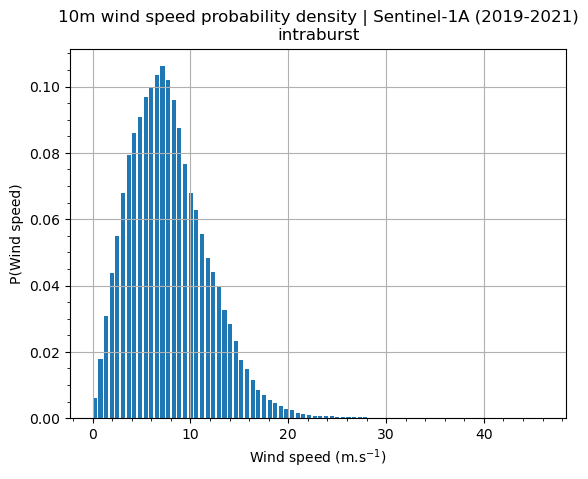

In [25]:
plt.hist(wnd_spd, bins=80, width=.42, density=True)
plt.xlabel('Wind speed (m.s$^{-1}$)')
plt.ylabel('P(Wind speed)')
plt.title('10m wind speed probability density | Sentinel-1A (2019-2021)\nintraburst') 
plt.minorticks_on()
plt.grid()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/wspd_histo_s1a_intra.png')
plt.show()

## 2.2) verification plots : azimutal modulation of IMACS & s0 around 15m/s and 40° of incidence

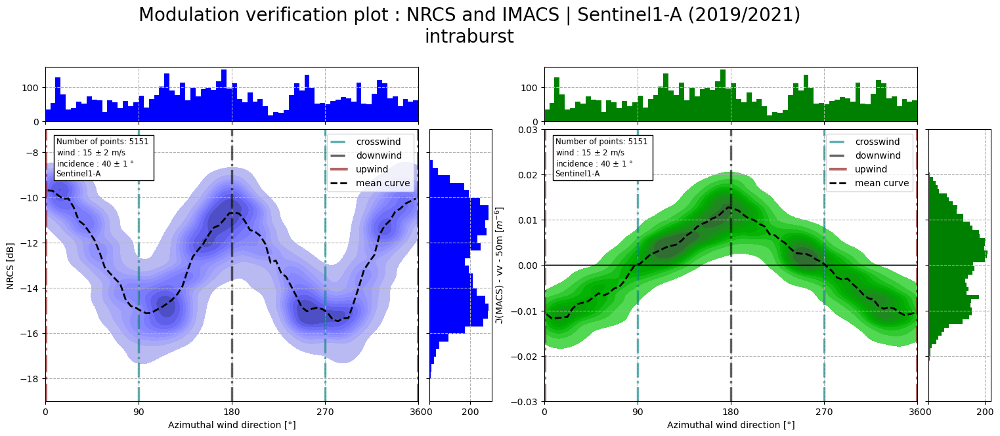

In [27]:
mask_verif = (wnd_spd.values > 13) & (wnd_spd.values < 17) & (incidence.values > 39) & (incidence.values < 41)  # selection of a range of 2 m/s around 15m/s wind speed and a range of 1° around 40° of incidence
NRCS_verif = NRCS[mask_verif]                          
macs_Im_verif = macs_Im[mask_verif]                    
az_wdir_verif = az_wdir.loc[NRCS_verif.index]       # selection of the az_wdir corresponding to the range 



### plot figures ###
fig = plt.figure(figsize=(8, 6))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85


### NRCS ###
gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
              left   = dx + (wdt + dx)*0, right = dx + wdt + (dx + wdt)*0,
              bottom = dy , top   = dy + hgt,
              wspace = 0.05, hspace = 0.05)      
ymax=-7; ymin=-19
xmin=0;xmax=360

# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

# central plot
sns.kdeplot(x=az_wdir_verif, y=NRCS_verif, color='blue', bw_adjust=.5, ax=ax, fill=True) 
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('NRCS [dB]')
ax.grid(ls='--')
ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], ymin, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, ymin, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], ymin, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)

## Histograms  
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='blue')
ax_histx.grid(ls='--')
y_bins = np.arange(min(NRCS_verif), max(NRCS_verif) , binwidth/3)
ax_histy.hist(NRCS_verif, bins=y_bins, color='blue', orientation='horizontal')
ax_histy.grid(ls='--')

## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel1-A' % (len(NRCS_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, NRCS_verif)
ax.legend()


### IMACS ###
gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
              left   = dx + (wdt + dx)*1, right = dx + wdt + (dx + wdt)*1,
              bottom = dy , top   = dy + hgt,
              wspace = 0.05, hspace = 0.05) 
ymax= 0.03

# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

sns.kdeplot(x=az_wdir_verif, y=macs_Im_verif, color='green', bw_adjust=.5, ax=ax, fill=True)
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('$\Im$(MACS) - vv - 50m [$m^{-6}$]')
ax.grid(ls='--')
ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(-ymax, ymax)

## Histograms  
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='green')
ax_histx.grid(ls='--')
y_bins = np.arange(-ymax, ymax , binwidth*ymax**2)
ax_histy.hist(macs_Im_verif,bins=y_bins, color='green', orientation='horizontal')
ax_histy.grid(ls='--')

## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel1-A' % (len(macs_Im_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, macs_Im_verif)
ax.legend()

ax.set_title('Modulation verification plot : NRCS and IMACS | Sentinel1-A (2019/2021)\nintraburst',y=1.3, x=0-2*dx, fontsize=20)
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/verif_plots_s1a_intra.png',bbox_inches='tight')

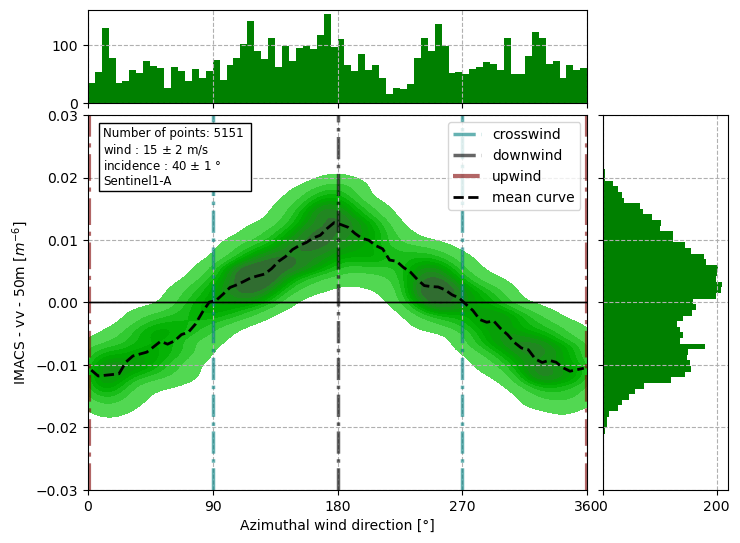

In [28]:
# plot figure
fig = plt.figure(figsize=(8, 6))
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)
# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

## Density Plot
sns.kdeplot(x=az_wdir_verif, y=macs_Im_verif, color='green', fill=True, bw_adjust=.5, ax=ax, label='Sentinel1-A')
ax.set_xlim(-5,365)
ax.set_ylim(-0.03, 0.03)
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('IMACS - vv - 50m [$m^{-6}$]' )

ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(-ymax, ymax)
ax.grid(ls='--')


## Histogramms 
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='green')
ax_histx.grid(ls='--')
y_bins = np.arange(-ymax, ymax , binwidth*ymax**2)
ax_histy.hist(macs_Im_verif,bins=y_bins, color='green', orientation='horizontal')
ax_histy.grid(ls='--')

## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel1-A' % (len(macs_Im_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, macs_Im_verif)

ax.legend()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/verif_plots_imacs_s1a_intra.png')

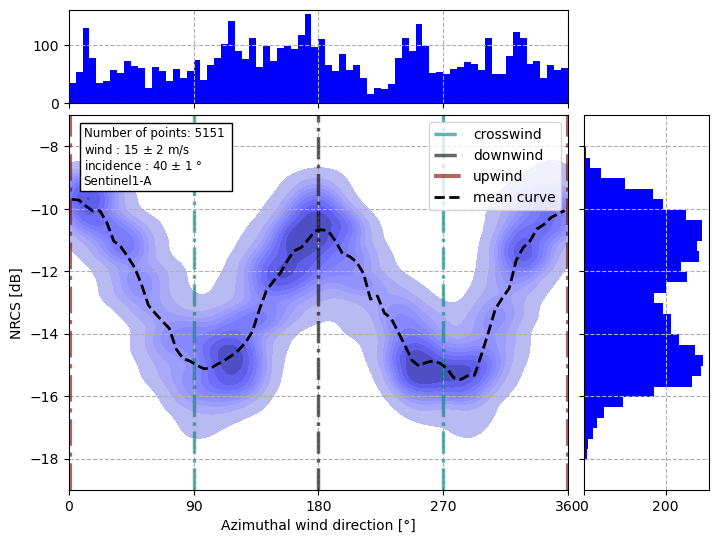

In [29]:
# plot figure
fig = plt.figure(figsize=(8, 6))
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

# Create the Axes
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ymax=-7; ymin=-19
xmin=0;xmax=360

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

## density plots 
sns.kdeplot(x=az_wdir_verif, y=NRCS_verif, color='blue', fill=True, bw_adjust=.5, ax=ax, label='Sentinel1-A')
ax.set_xlim(-5,365)
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('NRCS [dB]')

ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], ymin, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, ymin, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], ymin, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
ax.grid(ls='--')

## Histogramms
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='blue')
ax_histx.grid(ls='--')
y_bins = np.arange(min(NRCS_verif), max(NRCS_verif) , binwidth/3)
ax_histy.hist(NRCS_verif, bins=y_bins, color='blue', orientation='horizontal')
ax_histy.grid(ls='--')


## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel1-A' % (len(NRCS_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, NRCS_verif)

ax.legend()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/verif_plots_nrcs_s1a_intra.png')

## 2.3) Discretisation of incidence angles (at 6 m/s) with the Find_peaks function

### 2.3.1) Discrétisation using incidence angles around 6 m/s (not to do)  

In [9]:
## we retrieve the part of the dataframe were the wind is around 6 m/s
df_6ms = df[(df['Wspeed'] > 4) & (df['Wspeed'] < 8)].sort_values(by='incidence')
#display(df_5ms)

az_wdir_6ms = df_6ms['wdir_az']
macs_Im_6ms = df_6ms['macs_Im_lambda_max=50.0']
NRCS_6ms = df_6ms['sigma0_dB_filt']
incidence_6ms = df_6ms['incidence']

First we visualise the peaks with an histogram 

array([  5,   9,  21,  25,  37,  41,  53,  57,  75,  79,  90,  94, 104,
       108, 119, 122, 132, 136, 149, 153, 162, 166, 175, 179, 188, 192])

26

array([31.55536626, 31.84617926, 32.71861828, 33.00943128, 33.8818703 ,
       34.1726833 , 35.04512232, 35.33593532, 36.64459385, 36.93540685,
       37.73514262, 38.02595562, 38.75298813, 39.04380114, 39.8435369 ,
       40.06164666, 40.78867917, 41.07949217, 42.02463444, 42.31544745,
       42.96977671, 43.26058971, 43.91491897, 44.20573198, 44.86006124,
       45.15087425])


mean incidence angle :



[31.70077275897436,
 32.86402477948718,
 34.027276799999996,
 35.190528820512824,
 36.79000034871795,
 37.88054911794872,
 38.89839463589743,
 39.95259177948718,
 40.934085671794875,
 42.17004094358974,
 43.115183210256404,
 44.06032547692307,
 45.00546774358975]

13

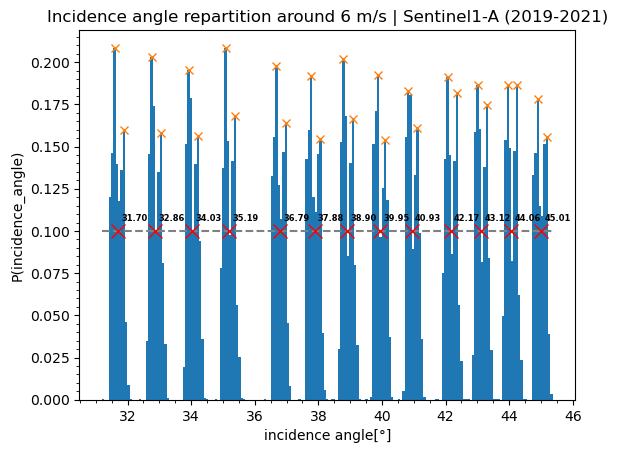

In [89]:
from scipy.signal import find_peaks

## Search of the peaks 
hist, bins = np.histogram(incidence_6ms, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## Plot
plt.hist(incidence_6ms, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition around 6 m/s | Sentinel1-A (2019-2021)')
plt.minorticks_on()

#display(hist, bins)
display(peaks, len(peaks), bins[peaks])


## Then, we search the mean incidences angles 
mean_iangle_6ms = find_mean_incidence_angle(bins[peaks], gap=0.5)
print("\nmean incidence angle :\n")
display(mean_iangle_6ms, len(mean_iangle_6ms))

plt.plot(mean_iangle_6ms, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle_6ms):
    plt.annotate(f"{angle:.2f}", xy=(mean_iangle_6ms[i]+0.1, 0.11), 
                 ha='left', va='top', fontsize=6, fontweight='bold')
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/intra/S1A/inc_angle_histo6ms_s1a_intra.png')
plt.show()

###  2.3.2) Discrétisation using all incidence angles

array([  5,   8,  21,  25,  37,  41,  53,  57,  75,  79,  89,  93, 104,
       108, 118, 122, 132, 136, 149, 153, 162, 166, 175, 179, 187, 191])

26

array([31.55536626, 31.77347601, 32.71861828, 33.00943128, 33.8818703 ,
       34.1726833 , 35.04512232, 35.33593532, 36.64459385, 36.93540685,
       37.66243936, 37.95325237, 38.75298813, 39.04380114, 39.77083365,
       40.06164666, 40.78867917, 41.07949217, 42.02463444, 42.31544745,
       42.96977671, 43.26058971, 43.91491897, 44.20573198, 44.78735799,
       45.07817099])


mean incidence angle :



[31.664421133333335,
 32.86402477948718,
 34.027276799999996,
 35.190528820512824,
 36.79000034871795,
 37.80784586666667,
 38.89839463589743,
 39.91624015384615,
 40.934085671794875,
 42.17004094358974,
 43.115183210256404,
 44.06032547692307,
 44.9327644923077]

13

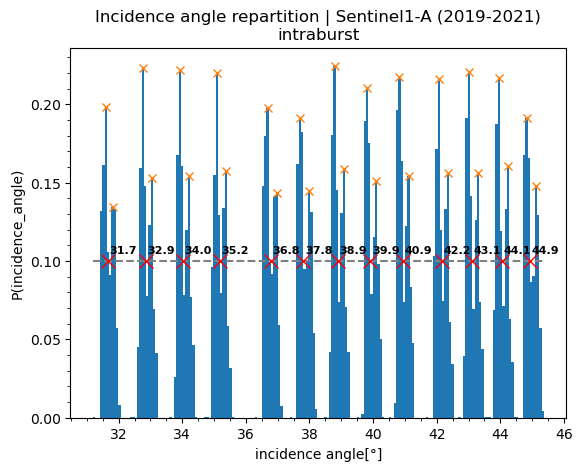

In [9]:
## Search of the peaks 
hist, bins = np.histogram(incidence, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## Plot
plt.hist(incidence, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition | Sentinel1-A (2019-2021)\nintraburst')
plt.minorticks_on()

#display(hist, bins)
display(peaks, len(peaks), bins[peaks])


## Then, we search the mean incidences angles 
mean_iangle= find_mean_incidence_angle(bins[peaks], gap=0.5)
print("\nmean incidence angle :\n")
display(mean_iangle, len(mean_iangle))

plt.plot(mean_iangle, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle):
    plt.annotate(f"{angle:.1f}", xy=(mean_iangle[i]+0.05, 0.11), 
                 ha='left', va='top', fontsize=8, fontweight='bold')
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/inc_angle_histo_s1a_intra.png')
plt.show()

In [95]:
diff = []
diff = [abs(mean_iangle_6ms[i] - mean_iangle[i]) for i in range(13)]    
display(diff, np.max(diff))

[0.0017510410256420528,
 0.005753420512817797,
 0.009755800000007753,
 0.013758179487176392,
 0.053691948717954574,
 0.049939717948717544,
 0.026515764102569506,
 0.006333779487178504,
 0.033519928205123506,
 0.03518094358973656,
 0.0045476897436032004,
 0.02867707692306709,
 0.025425143589743016]

0.053691948717954574

# 3) Discretisation of incidence angles for different wind speed ranges

In [10]:
wnd_spd_5ms = wnd_spd[(wnd_spd > 3) & (wnd_spd < 7)]
wnd_spd_10ms = wnd_spd[(wnd_spd > 8) & (wnd_spd < 12)]
wnd_spd_15ms = wnd_spd[(wnd_spd > 13) & (wnd_spd < 17)]
wnd_spd_20ms = wnd_spd[(wnd_spd > 18) & (wnd_spd < 22)]

#display(wnd_spd_5ms, wnd_spd_5ms.index)
inc_tot =[incidence.loc[wnd_spd_5ms.index],incidence.loc[wnd_spd_10ms.index],incidence.loc[wnd_spd_15ms.index], incidence.loc[wnd_spd_20ms.index]]
mean_iangle_iw1 = mean_iangle[:4]
mean_iangle_iw2 = mean_iangle[4:9]
mean_iangle_iw3 = mean_iangle[9:]

# 4) Plot of I_MACS for different wind speeds & incidence angles

In [11]:
macs_Im_tot = [macs_Im.loc[wnd_spd_5ms.index],macs_Im.loc[wnd_spd_10ms.index],macs_Im.loc[wnd_spd_15ms.index], macs_Im.loc[wnd_spd_20ms.index]]

## 4.1) All IW1 subswaths for all S1A/B data

### 4.1.1) only for 5 m/s

In [ ]:
mean_iangle_iw1 = mean_iangle[:4]

### For Wind speed = 5m/s
incidence_5ms = incidence.loc[wnd_spd_5ms.index]
macs_Im_5ms = macs_Im.loc[wnd_spd_5ms.index]

## Plot 
fig, ax = plt.subplots(1,4, figsize=(30,6))
col=['blue', 'green', 'red', 'orange']

for i in range(len(mean_iangle_iw1)) : 
    Imacs_sel = macs_Im_5ms[(incidence_5ms > mean_iangle_iw1[i]-1) & (incidence_5ms < mean_iangle_iw1[i]+1)]  # selection of a range of 1° around one mean incidence angle
    az_wdir_sel = az_wdir.loc[Imacs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
    ax[i].scatter(az_wdir_sel ,Imacs_sel, color = col[i], label='Sentinel-1A')

    
    # mean curve calculation
    az_wdir_sel_mean = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100) # settings points for the mean curve
    Imacs_mean = np.zeros_like(az_wdir_sel_mean)                            # Initialise mean s0 values
    bin_edges = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100)        # discretize the data in 100 bins 
    for j in range(len(bin_edges) - 1):
        mask = (az_wdir_sel >= bin_edges[j]) & (az_wdir_sel < bin_edges[j+1])     # Mask to selects the points in the bin
        Imacs_mean[j] = np.mean(Imacs_sel[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    ax[i].plot(az_wdir_sel_mean, Imacs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

    
    ax[i].grid()
    ax[i].legend()
    ax[i].set_xlabel('Azimuthal wind direction [°]')
    ax[i].set_ylabel('I_macs (vv, 50m) []')
    ax[i].set_title(r'Wind Speed : 5 $\pm$ 2 m/s | inc_angle : '+ str("{:.2f}".format(float(mean_iangle_iw1[i])))+' $\pm$ 1 °')   
fig.suptitle('Iw1 subswath', fontsize=20)
fig.show()

### 4.1.2) for 5, 10, 15, 20 m/s

Ploting time : 243.50026440620422 s


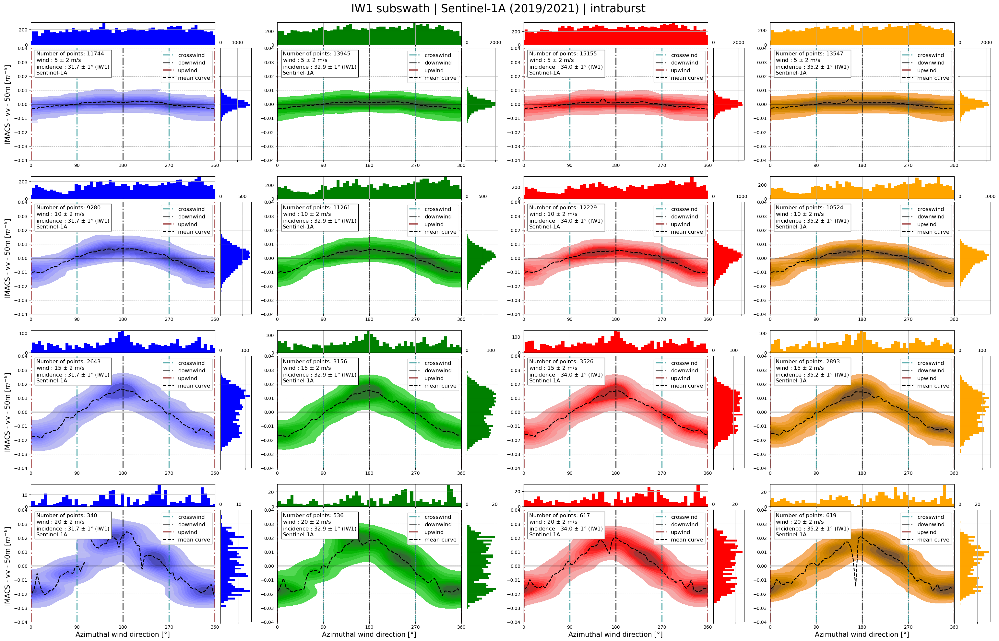

In [37]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw1)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[pp][(inc_tot[pp] > mean_iangle_iw1[cpt]-1) & (inc_tot[pp] < mean_iangle_iw1[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=-0.04;ymax=0.04;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw1)%2 == 0 and cpt == (len(mean_iangle_iw1)/2)-1: 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw1)%2 == 1 and cpt == len(mean_iangle_iw1)/2 - 0.5 : 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1) \nSentinel-1A' %(len(Imacs_sel), (pp+1)*5, mean_iangle_iw1[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, imacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , ybinwidth)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/IMACS_azwdir_IW1_s1a_intra.png',bbox_inches='tight')

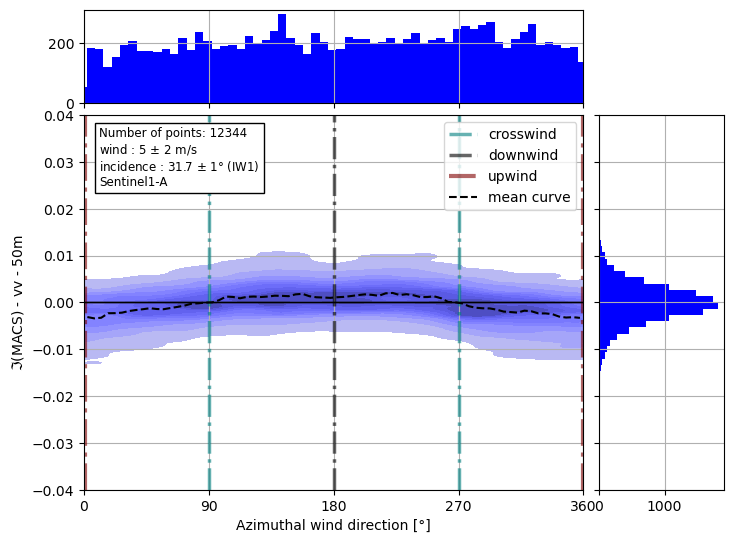

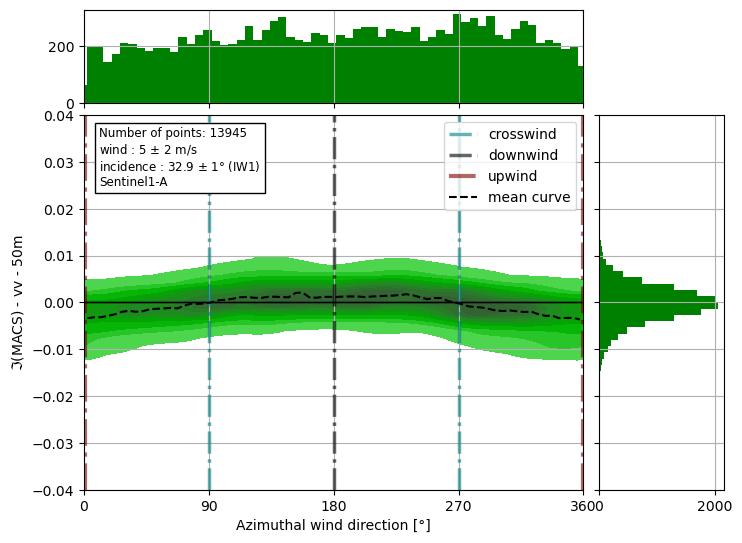

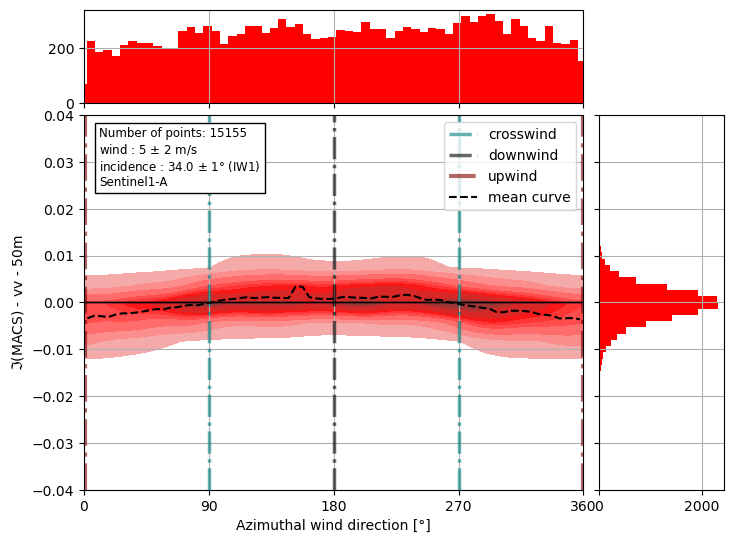

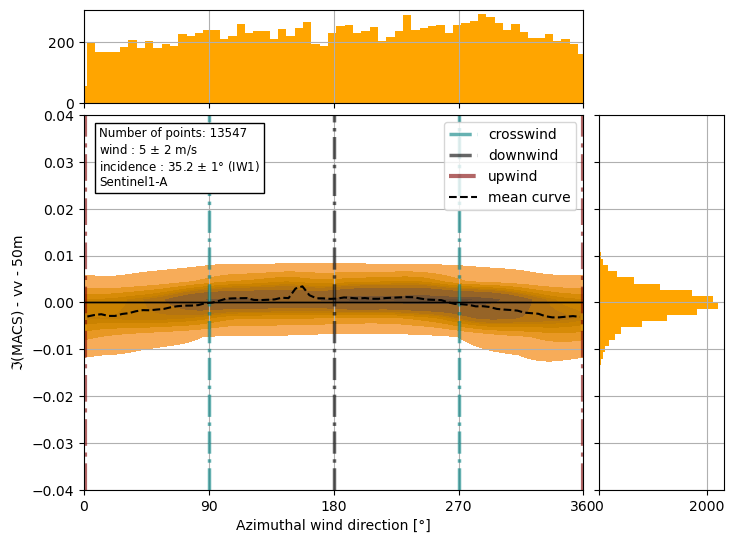

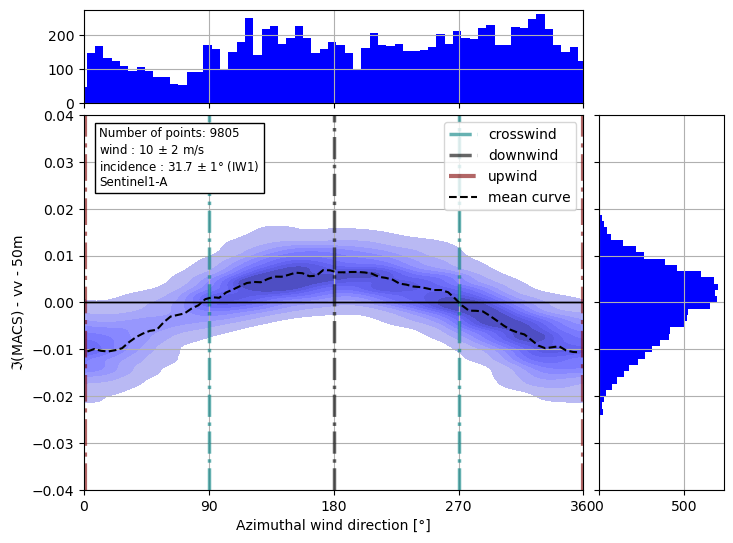

...

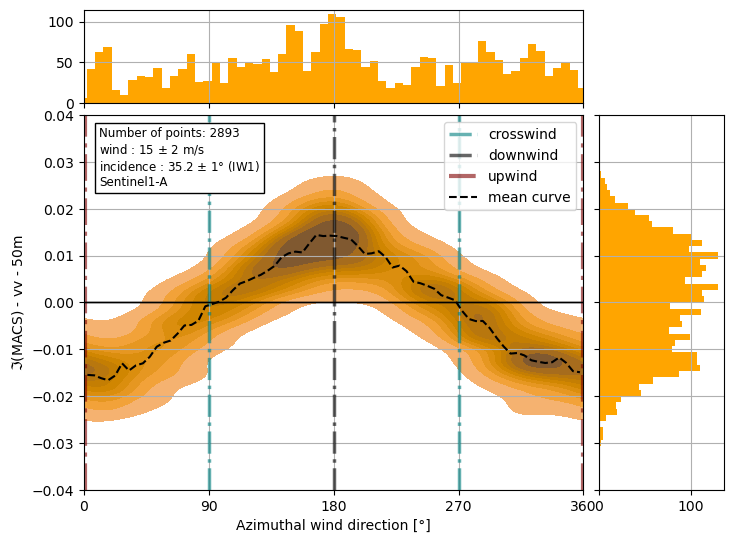

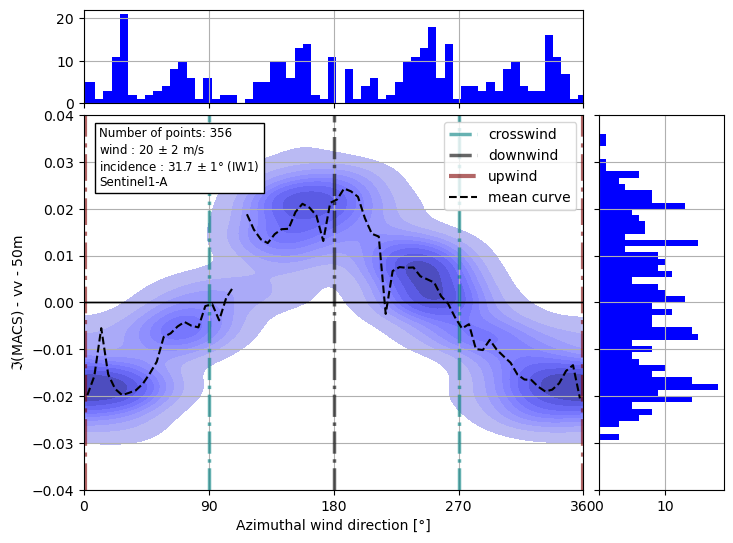

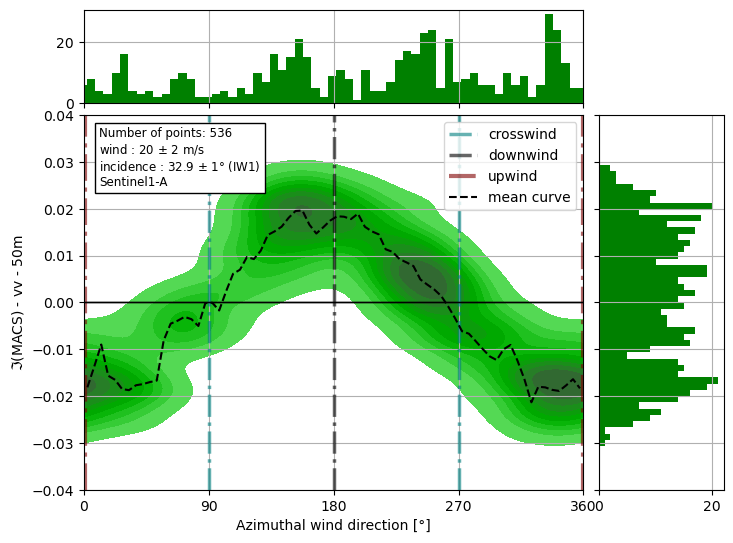

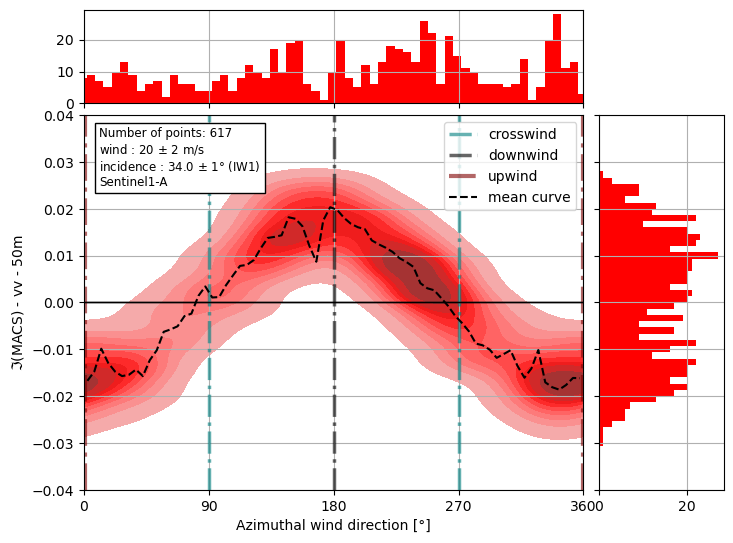

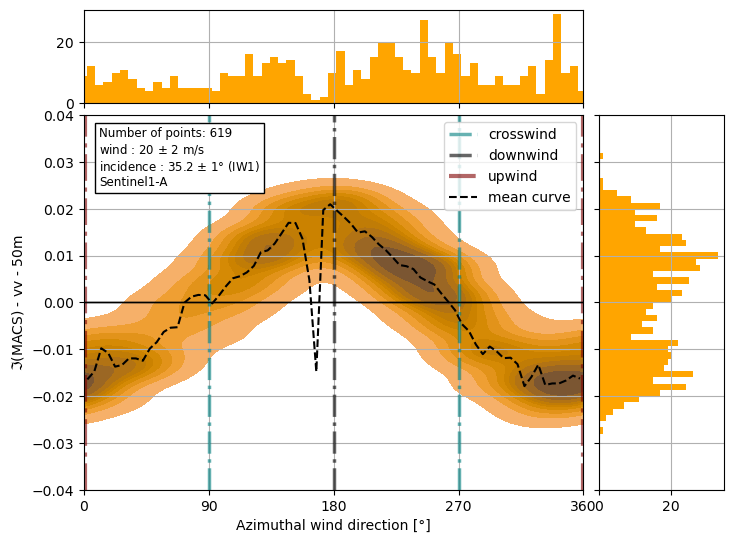

In [15]:
col=['blue', 'green', 'red', 'orange']

for i in range(len(inc_tot)) :             # discretization over the wind spd  
    for j in range(len(mean_iangle_iw1)):  # discretization over the incindence angles

        
        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[i][(inc_tot[i] > mean_iangle_iw1[j]-1) & (inc_tot[i] < mean_iangle_iw1[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])




        
        ### plot figure ###

        fig = plt.figure(figsize=(8, 6))
        gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                              left=0.1, right=0.9, bottom=0.1, top=0.9,
                              wspace=0.05, hspace=0.05)
        
        # Create the Axes.
        ax = fig.add_subplot(gs[1, 0])
        ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
        ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
        
        # no labels
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        
        
        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[j], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ymax = 0.040
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(0,360)
        ax.set_ylim(-ymax, ymax)
        ax.set_xlabel('Azimuthal wind direction [°]')
        ax.set_ylabel('$\Im$(MACS) - vv - 50m')
        ax.grid()
        
        
        ### density plots 
        binwidth = 1
        
        x_bins = np.arange(-70,420 + binwidth, binwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[j])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , binwidth*ymax/30)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[j], orientation='horizontal')
        ax_histy.grid()
        
        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1) \nSentinel1-A' %(len(Imacs_sel), (i+1)*5, mean_iangle_iw1[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)
        
        ### mean curve calculation
        mean_curve_calc(az_wdir_ext, imacs_ext)
        
        
        ax.legend()
        fig.show()
        fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1A_upgrade_plots/IMACS/IW1/IMACS_azwdir_inc'+str(round(mean_iangle_iw1[j]))+ '_wspd' + str((i+1)*5)+'ms.png')

## 4.2) Plot of all IW2 subswaths for all S1A/B data

Ploting time : 442.38795232772827 s


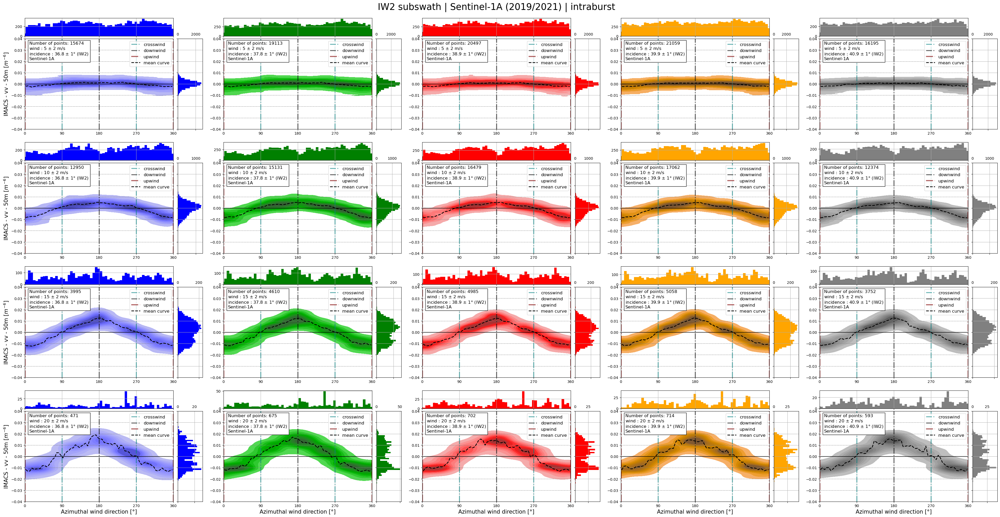

In [38]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange','gray']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw2)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[pp][(inc_tot[pp] > mean_iangle_iw2[cpt]-1) & (inc_tot[pp] < mean_iangle_iw2[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=-0.04;ymax=0.04;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw2)%2 == 0 and cpt == (len(mean_iangle_iw2)/2)-1: 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw2)%2 == 1 and cpt == len(mean_iangle_iw2)/2 - 0.5 : 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2) \nSentinel-1A' %(len(Imacs_sel), (pp+1)*5, mean_iangle_iw2[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, imacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , ybinwidth)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/IMACS_azwdir_IW2_s1a_intra.png',bbox_inches='tight')

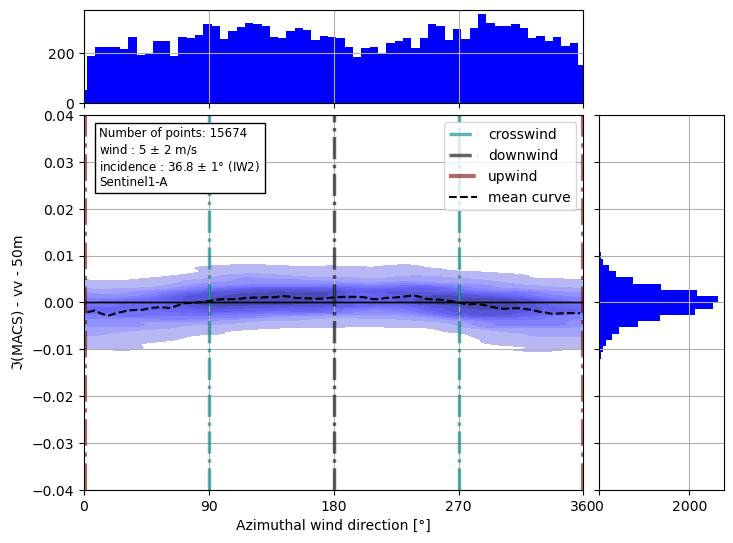

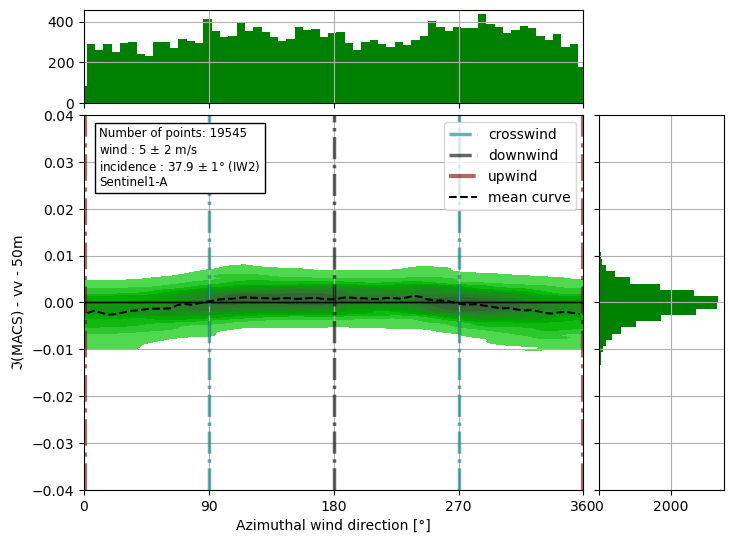

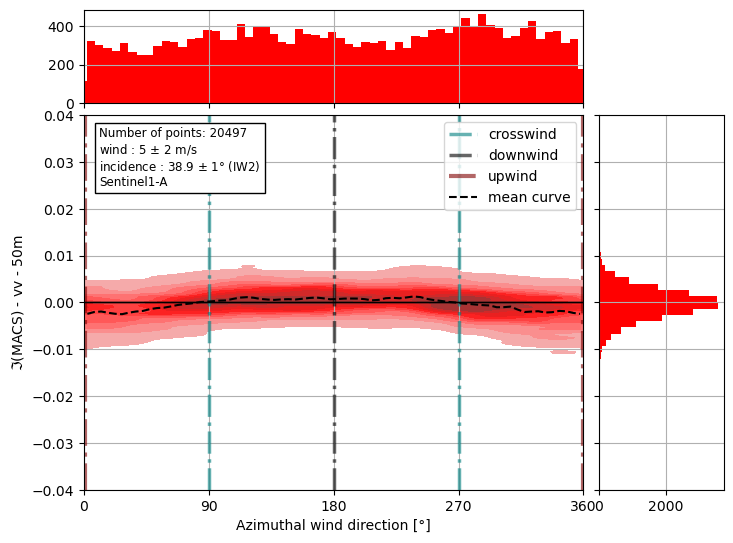

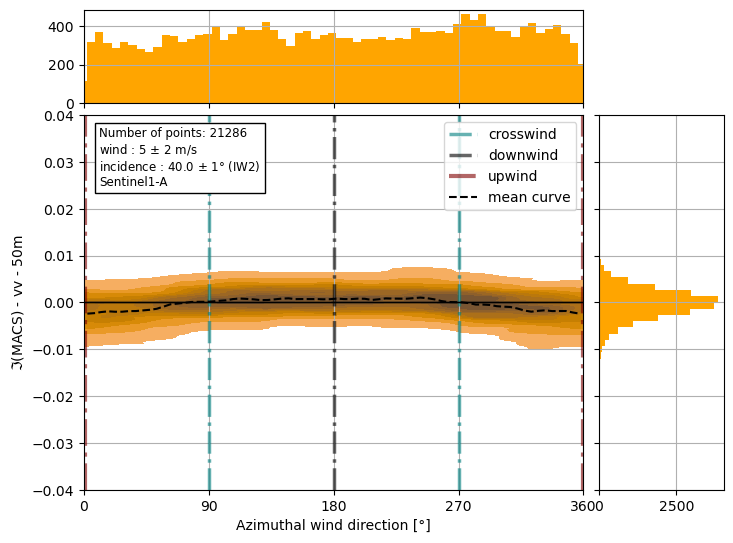

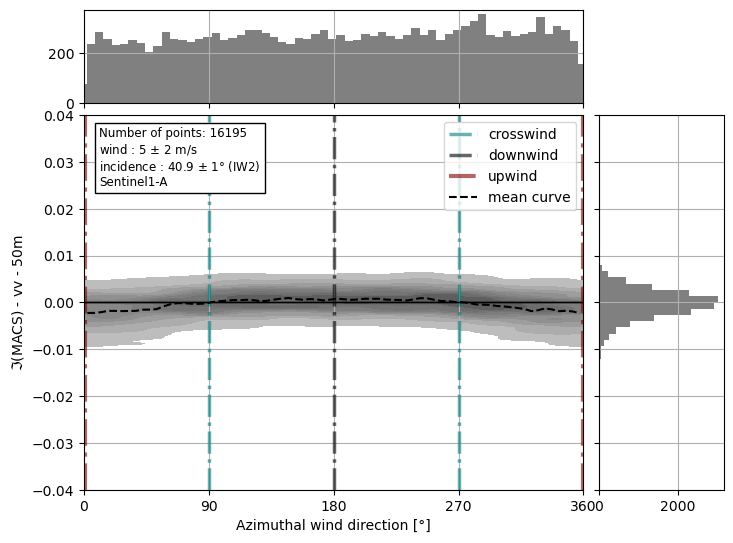

...

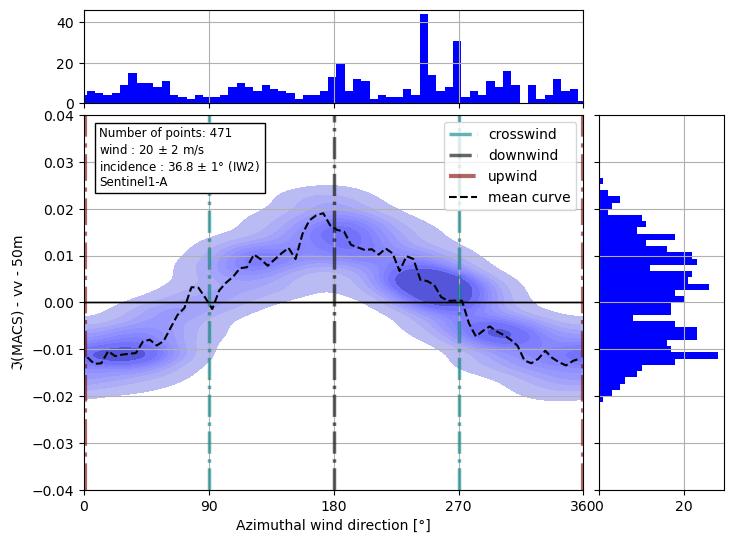

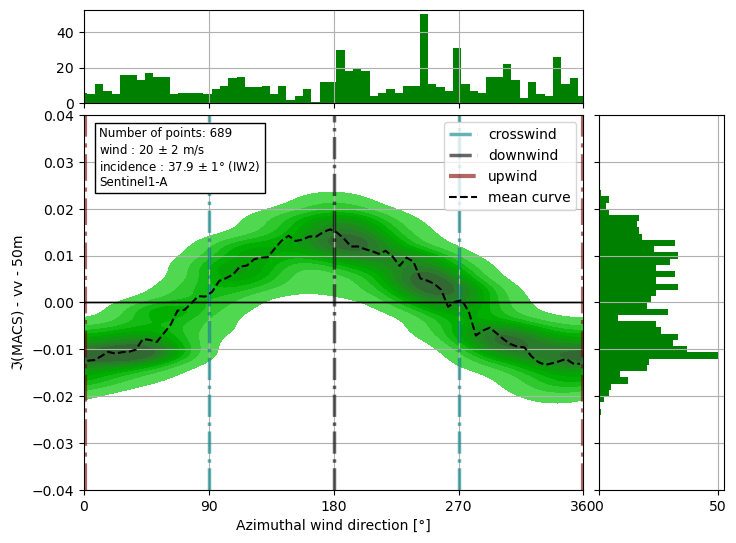

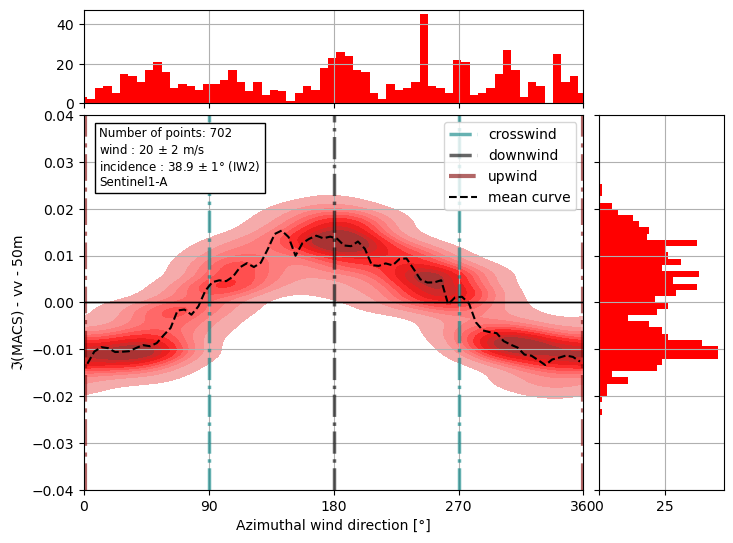

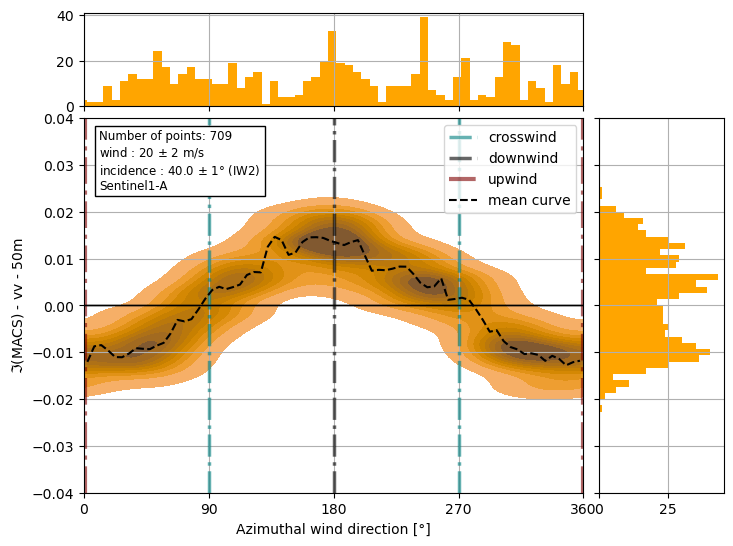

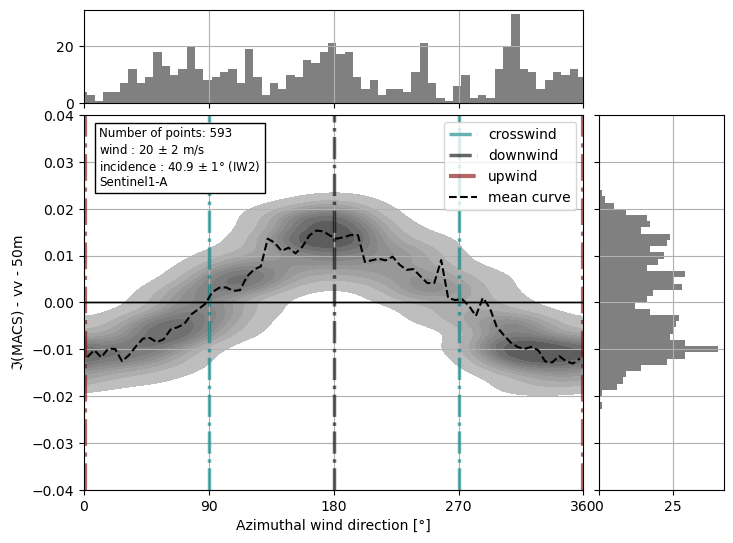

In [16]:
col=['blue', 'green', 'red', 'orange','gray']

for i in range(len(inc_tot)) :             # discretization over the wind spd
    for j in range(len(mean_iangle_iw2)):  # discretization over the incindence angles



        
        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[i][(inc_tot[i] > mean_iangle_iw2[j]-1) & (inc_tot[i] < mean_iangle_iw2[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])




        
        ### plot figure ###

        fig = plt.figure(figsize=(8, 6))
        gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                              left=0.1, right=0.9, bottom=0.1, top=0.9,
                              wspace=0.05, hspace=0.05)
        
        # Create the Axes.
        ax = fig.add_subplot(gs[1, 0])
        ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
        ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
        
        # no labels
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        
        
        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[j], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ymax = 0.040
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(0,360)
        ax.set_ylim(-ymax, ymax)
        ax.set_xlabel('Azimuthal wind direction [°]')
        ax.set_ylabel('$\Im$(MACS) - vv - 50m')
        ax.grid()
        
        
        ### density plots 
        binwidth = 1
        
        x_bins = np.arange(-70,420 + binwidth, binwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[j])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , binwidth*ymax/30)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[j], orientation='horizontal')
        ax_histy.grid()
        
        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2) \nSentinel1-A' %(len(Imacs_sel), (i+1)*5, mean_iangle_iw2[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)
        
        ### mean curve calculation
        mean_curve_calc(az_wdir_ext, imacs_ext)
        
        
        ax.legend()
        fig.show()
        fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1A_upgrade_plots/IMACS/IW2/IMACS_azwdir_inc'+str(round(mean_iangle_iw2[j]))+ '_wspd' + str((i+1)*5)+'ms.png')

## 4.3) Plot of all IW3 subswaths for all S1A/B data

Ploting time : 379.791038274765 s


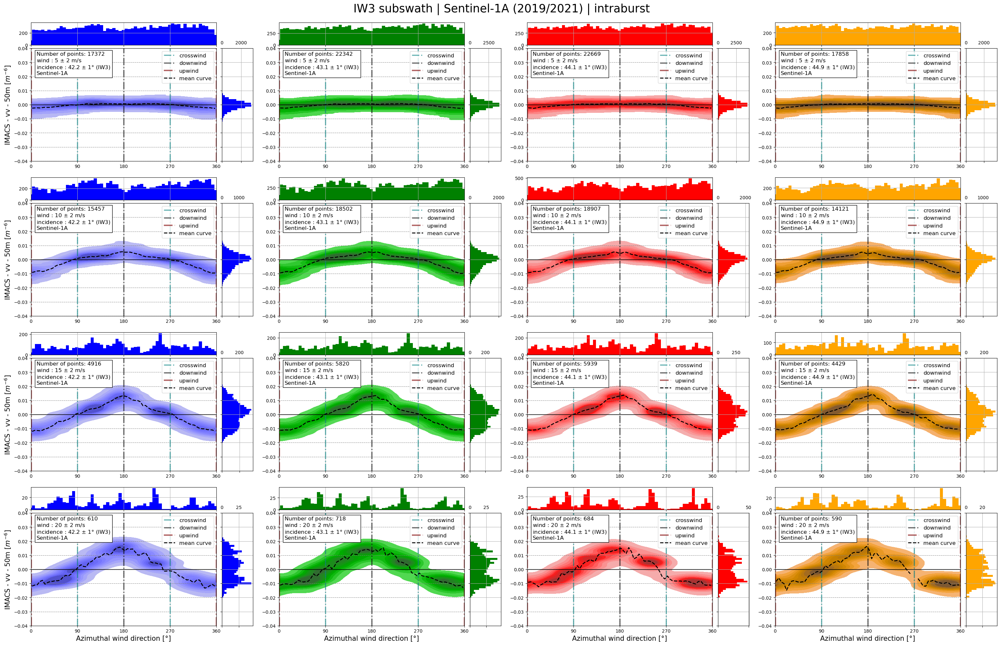

In [39]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw3)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[pp][(inc_tot[pp] > mean_iangle_iw3[cpt]-1) & (inc_tot[pp] < mean_iangle_iw3[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=-0.04;ymax=0.04;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw3)%2 == 0 and cpt == (len(mean_iangle_iw3)/2)-1: 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw3)%2 == 1 and cpt == len(mean_iangle_iw3)/2 - 0.5 : 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3) \nSentinel-1A' %(len(Imacs_sel), (pp+1)*5, mean_iangle_iw3[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, imacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , ybinwidth)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/IMACS_azwdir_IW3_s1a_intra.png',bbox_inches='tight')

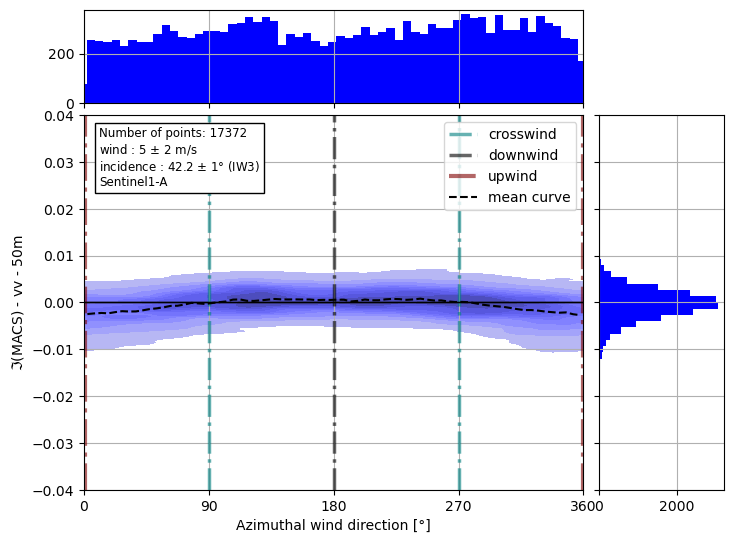

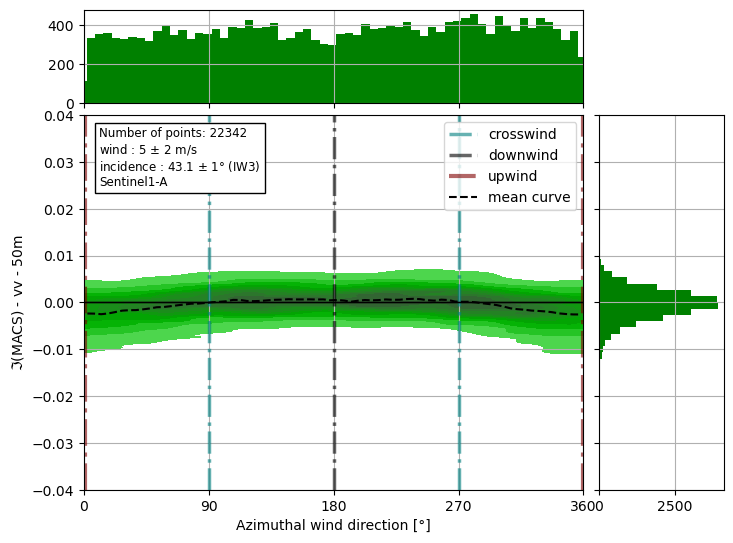

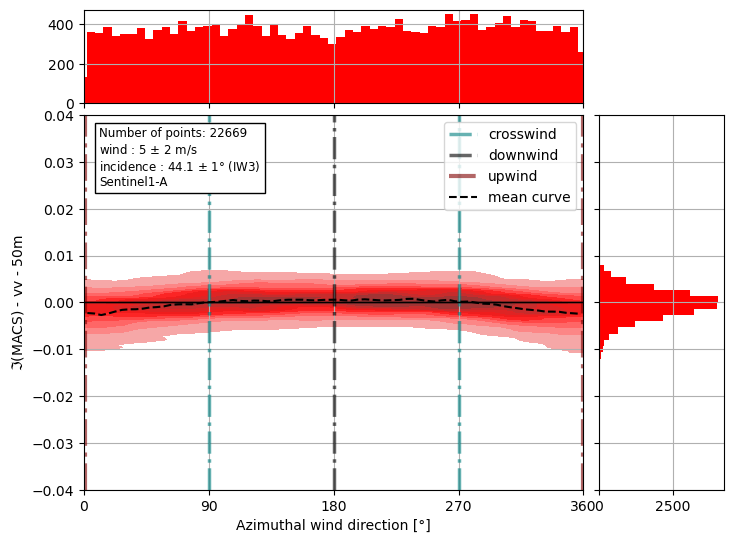

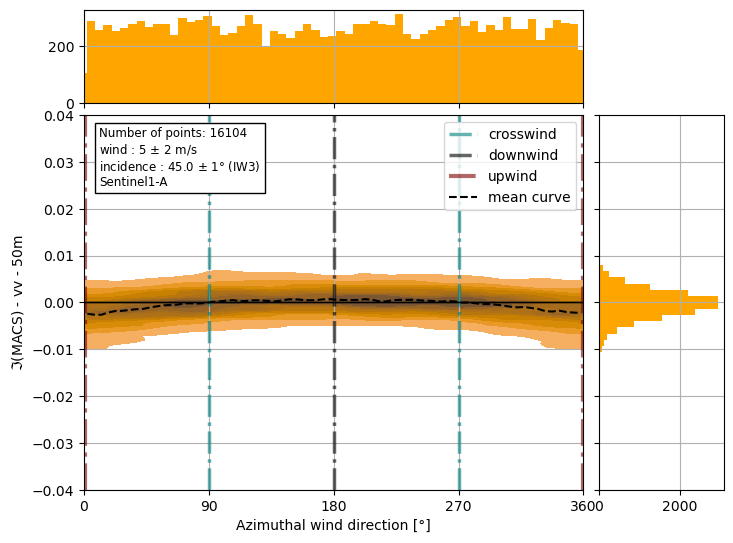

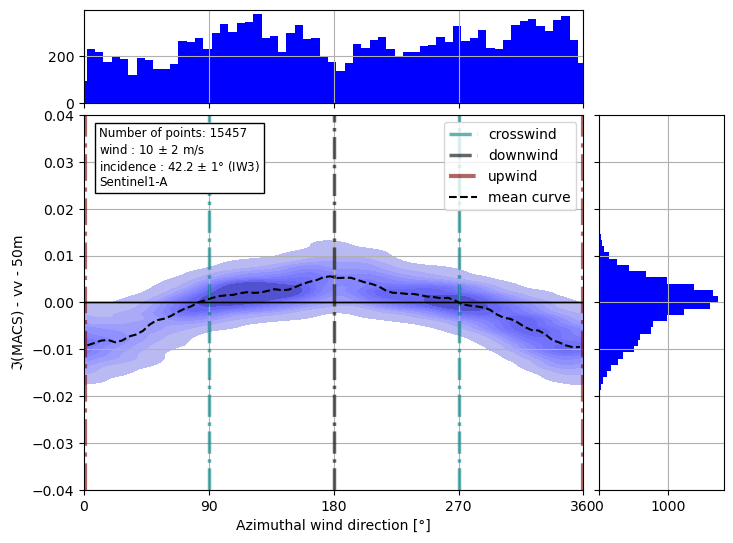

...

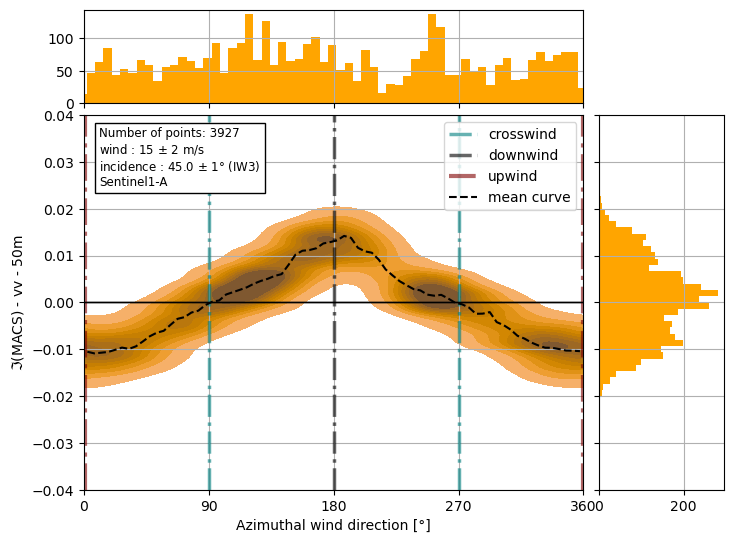

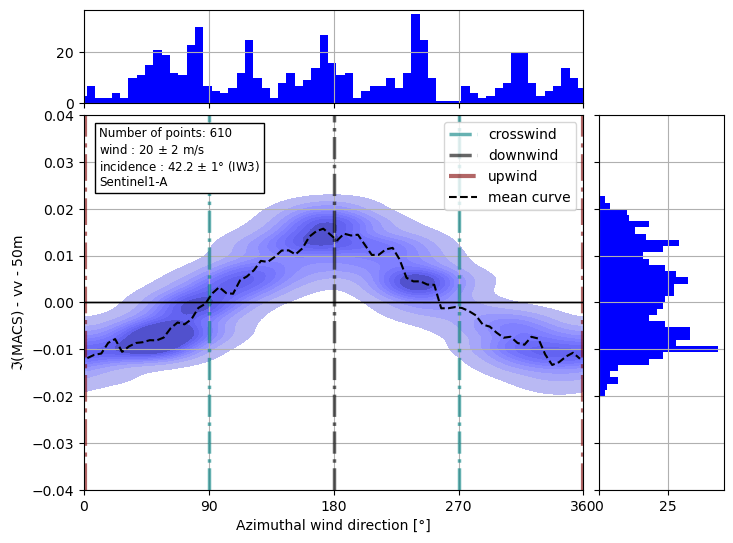

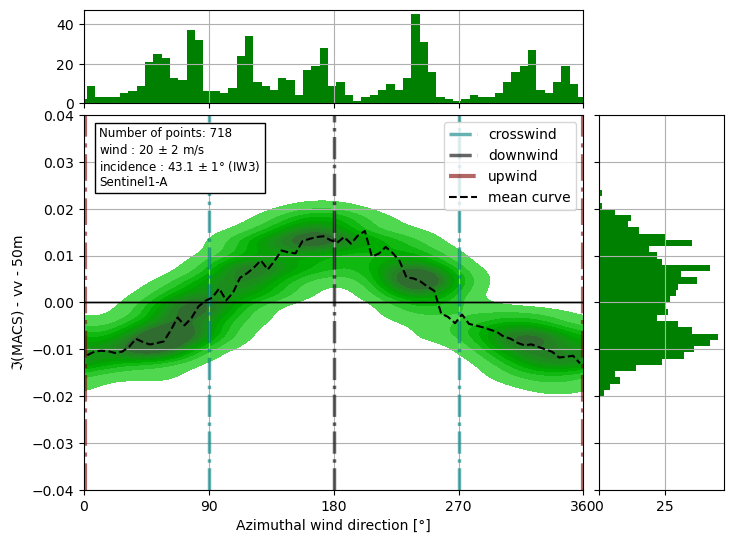

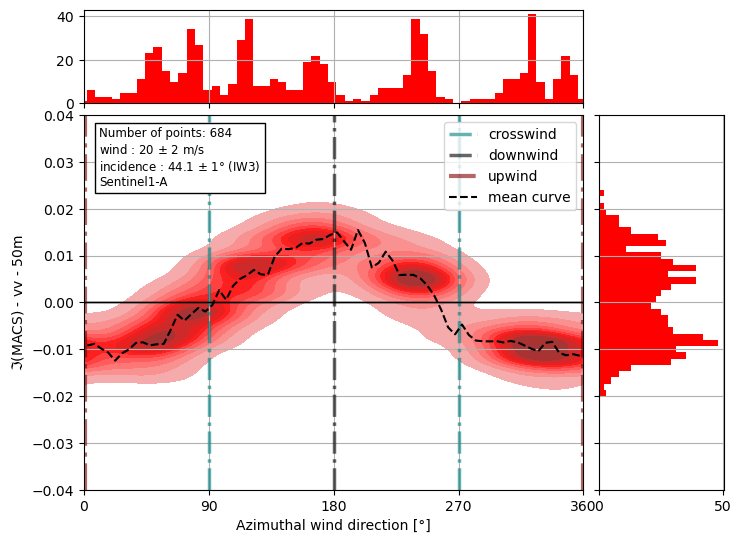

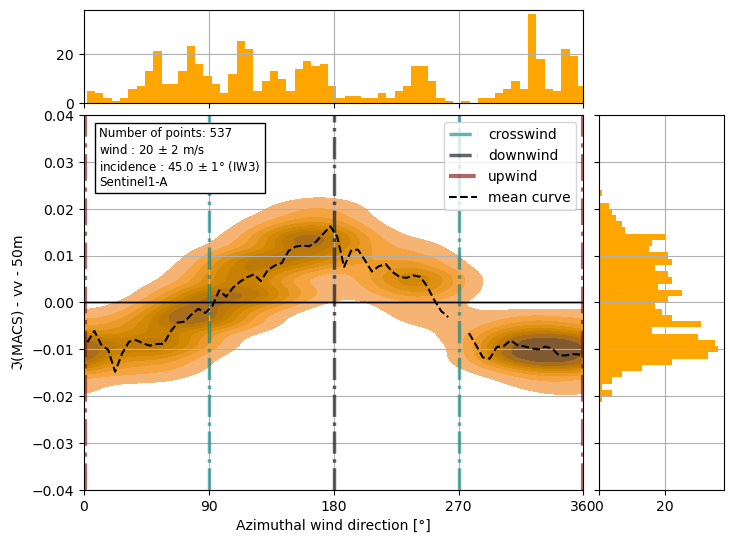

In [17]:
col=['blue', 'green', 'red', 'orange']

for i in range(len(inc_tot)) :             # discretization over the wind spd
    for j in range(len(mean_iangle_iw3)):  # discretization over the incindence angles



        
        ### Selection of the data ###
        
        Imacs_sel = macs_Im_tot[i][(inc_tot[i] > mean_iangle_iw3[j]-1) & (inc_tot[i] < mean_iangle_iw3[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])




        
        ### plot figure ###

        fig = plt.figure(figsize=(8, 6))
        gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                              left=0.1, right=0.9, bottom=0.1, top=0.9,
                              wspace=0.05, hspace=0.05)
        
        # Create the Axes.
        ax = fig.add_subplot(gs[1, 0])
        ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
        ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
        
        # no labels
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        
        
        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=imacs_ext, color=col[j], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ymax = 0.040
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(0,360)
        ax.set_ylim(-ymax, ymax)
        ax.set_xlabel('Azimuthal wind direction [°]')
        ax.set_ylabel('$\Im$(MACS) - vv - 50m')
        ax.grid()
        
        
        ### density plots 
        binwidth = 1
        
        x_bins = np.arange(-70,420 + binwidth, binwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[j])
        ax_histx.grid()
        
        y_bins = np.arange(-ymax, ymax , binwidth*ymax/30)
        ax_histy.hist(Imacs_sel, bins=y_bins, color=col[j], orientation='horizontal')
        ax_histy.grid()
        
        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3) \nSentinel1-A' %(len(Imacs_sel), (i+1)*5, mean_iangle_iw3[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)
        
        ### mean curve calculation
        mean_curve_calc(az_wdir_ext, imacs_ext)
        
        
        ax.legend()
        fig.show()
        fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1A_upgrade_plots/IMACS/IW3/IMACS_azwdir_inc'+str(round(mean_iangle_iw3[j]))+ '_wspd' + str((i+1)*5)+'ms.png')

# 5) Plot of Re_MACS for different wind speeds & incidence angles

In [12]:
macs_Re = df_tot['macs_Re_lambda_max=50.0']
macs_Re_tot = [macs_Re.loc[wnd_spd_5ms.index],macs_Re.loc[wnd_spd_10ms.index],macs_Re.loc[wnd_spd_15ms.index], macs_Re.loc[wnd_spd_20ms.index]]

## 5.1) Plot of all iw1 subswaths for all S1A/B data

Ploting time : 231.97537469863892 s


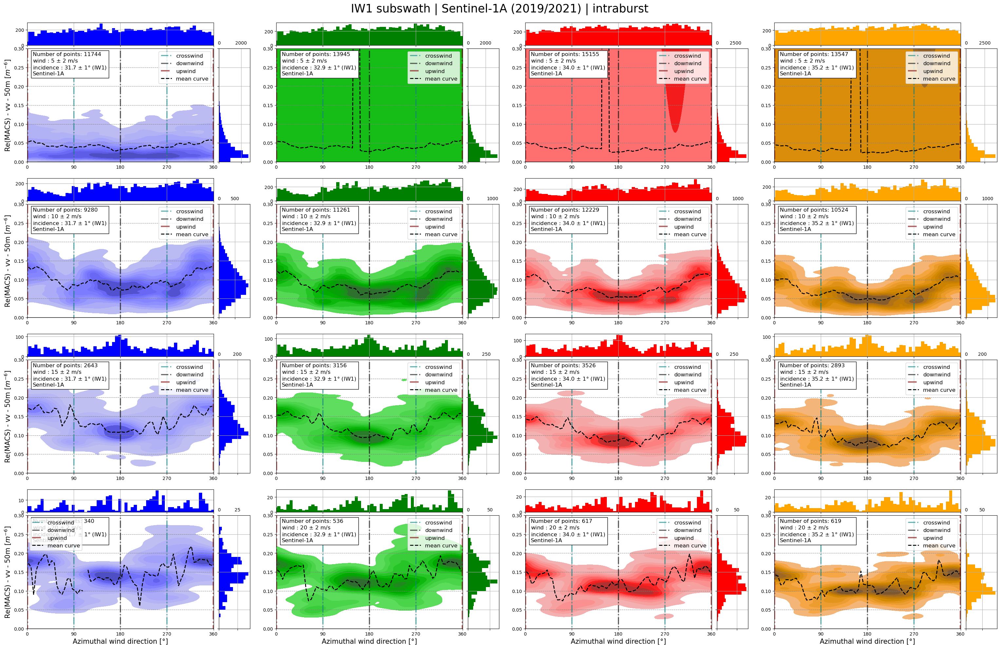

In [48]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw1)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Remacs_sel = macs_Re_tot[pp][(inc_tot[pp] > mean_iangle_iw1[cpt]-1) & (inc_tot[pp] < mean_iangle_iw1[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Remacs_sel = Remacs_sel[Remacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Remacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Remacs_before = Remacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Remacs_after = Remacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        remacs_ext = pd.concat([Remacs_before, Remacs_sel, Remacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=remacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw1)%2 == 0 and cpt == (len(mean_iangle_iw1)/2)-1: 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw1)%2 == 1 and cpt == len(mean_iangle_iw1)/2 - 0.5 : 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('Re(MACS) - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1) \nSentinel-1A' %(len(Remacs_sel), (pp+1)*5, mean_iangle_iw1[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, remacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(Remacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ReMACS_azwdir_IW1_s1a_intra.png',bbox_inches='tight')

## 5.2) Plot of all iw2 subswaths for all S1A/B data

Ploting time : 409.11863589286804 s


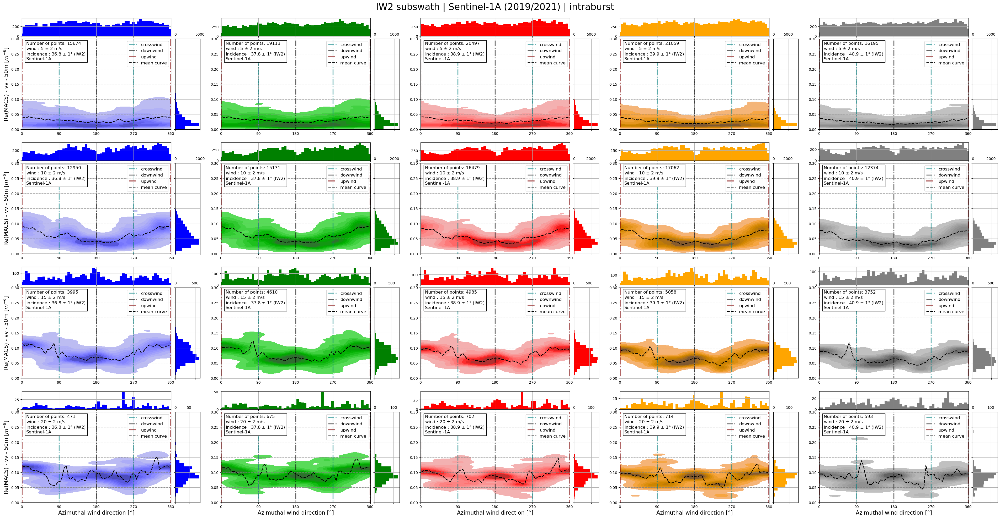

In [46]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange','gray']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw2)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Remacs_sel = macs_Re_tot[pp][(inc_tot[pp] > mean_iangle_iw2[cpt]-1) & (inc_tot[pp] < mean_iangle_iw2[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Remacs_sel = Remacs_sel[Remacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Remacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Remacs_before = Remacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Remacs_after = Remacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        remacs_ext = pd.concat([Remacs_before, Remacs_sel, Remacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=remacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw2)%2 == 0 and cpt == (len(mean_iangle_iw2)/2)-1: 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw2)%2 == 1 and cpt == len(mean_iangle_iw2)/2 - 0.5 : 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('Re(MACS) - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2) \nSentinel-1A' %(len(Remacs_sel), (pp+1)*5, mean_iangle_iw2[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, remacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(Remacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ReMACS_azwdir_IW2_s1a_intra.png',bbox_inches='tight')

## 5.3) Plot of all iw3 subswaths for all S1A/B data

Ploting time : 353.76671409606934 s


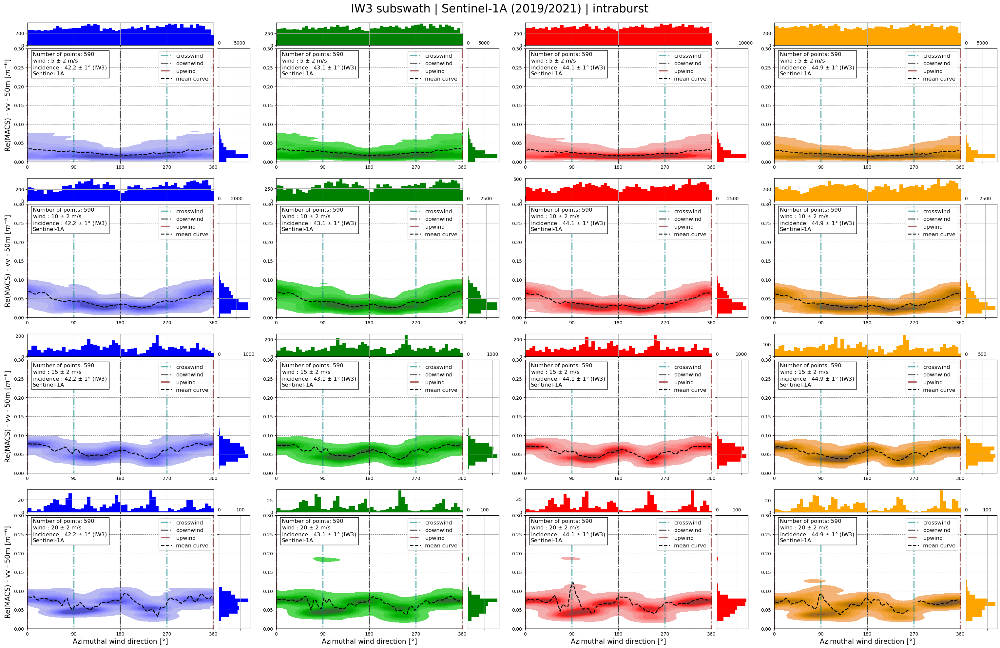

In [45]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw3)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        Remacs_sel = macs_Re_tot[pp][(inc_tot[pp] > mean_iangle_iw3[cpt]-1) & (inc_tot[pp] < mean_iangle_iw3[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Remacs_sel = Remacs_sel[Remacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[Remacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Remacs_before = Remacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Remacs_after = Remacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        remacs_ext = pd.concat([Remacs_before, Remacs_sel, Remacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=remacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw3)%2 == 0 and cpt == (len(mean_iangle_iw3)/2)-1: 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw3)%2 == 1 and cpt == len(mean_iangle_iw3)/2 - 0.5 : 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('Re(MACS) - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3) \nSentinel-1A' %(len(Remacs_sel), (pp+1)*5, mean_iangle_iw3[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, remacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(Remacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ReMACS_azwdir_IW3_s1a_intra.png',bbox_inches='tight')

# 6) Plot of |MACS| for different wind speeds & incidence angles

In [13]:
mod_macs = np.sqrt(macs_Re**2 + macs_Im**2)
mod_macs_tot = [mod_macs.loc[wnd_spd_5ms.index],mod_macs.loc[wnd_spd_10ms.index],mod_macs.loc[wnd_spd_15ms.index], mod_macs.loc[wnd_spd_20ms.index]]
#mod_macs

## 6.1) Plot of all iw1 subswaths for all S1A/B data

Ploting time : 153.2192680835724 s


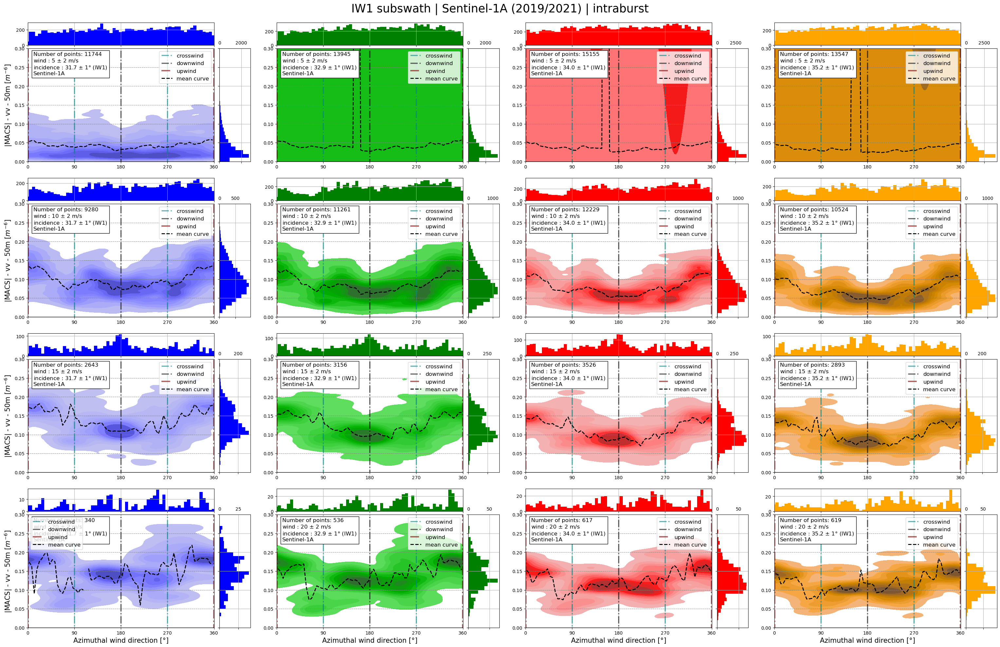

In [14]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw1)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        modmacs_sel = mod_macs_tot[pp][(inc_tot[pp] > mean_iangle_iw1[cpt]-1) & (inc_tot[pp] < mean_iangle_iw1[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        modmacs_sel = modmacs_sel[modmacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[modmacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        modmacs_before = modmacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        modmacs_after = modmacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        modmacs_ext = pd.concat([modmacs_before, modmacs_sel, modmacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=modmacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw1)%2 == 0 and cpt == (len(mean_iangle_iw1)/2)-1: 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw1)%2 == 1 and cpt == len(mean_iangle_iw1)/2 - 0.5 : 
                ax.set_title('IW1 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('|MACS| - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1) \nSentinel-1A' %(len(modmacs_sel), (pp+1)*5, mean_iangle_iw1[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, modmacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(modmacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ModMACS_azwdir_IW1_s1a_intra.png',bbox_inches='tight')

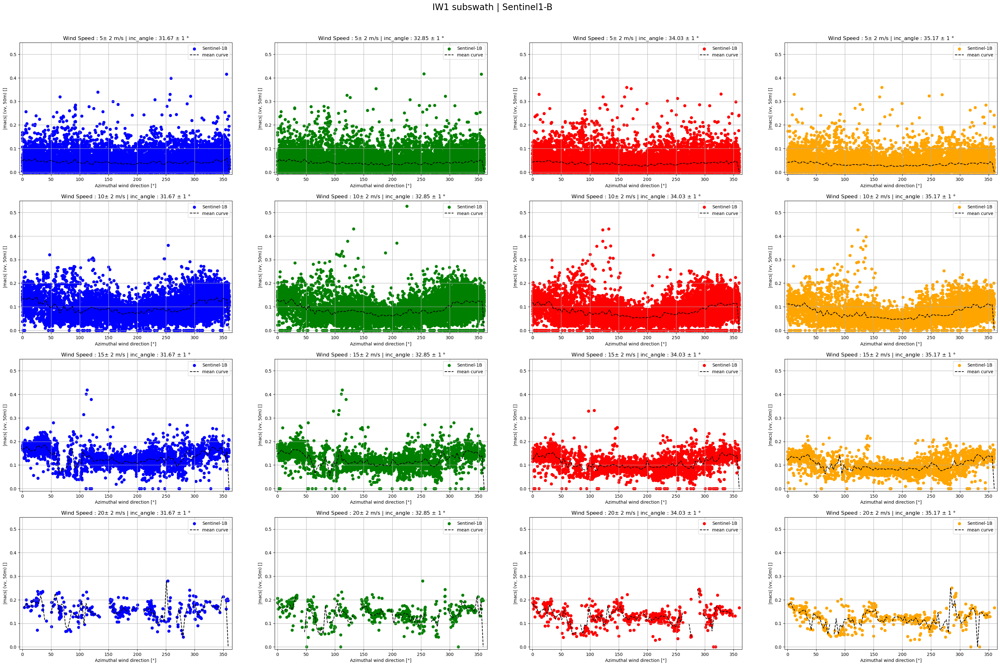

In [37]:
fig, ax = plt.subplots(4,4, figsize=(40,25))
col=['blue', 'green', 'red', 'orange']

for i in range(len(inc_tot)) :
    for j in range(len(mean_iangle_iw1)):
        macs_sel = macs[i][(inc_tot[i] > mean_iangle_iw1[j]-1) & (inc_tot[i] < mean_iangle_iw1[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wdir_sel = az_wdir.loc[macs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
        ax[i][j].scatter(az_wdir_sel ,macs_sel, color = col[j], label='Sentinel-1B')

        
        # mean curve calculation
        az_wdir_sel_mean = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100) # settings points for the mean curve
        mod_macs_mean = np.zeros_like(az_wdir_sel_mean)                           # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wdir_sel >= bin_edges[k]) & (az_wdir_sel < bin_edges[k+1])        # Mask to selects the points in the bin
            mod_macs_mean[k] = np.mean(macs_sel[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ax[i][j].plot(az_wdir_sel_mean, mod_macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        
        ax[i][j].grid()
        ax[i][j].legend()
        ax[i][j].set_xlim(-5,365)
        ax[i][j].set_ylim(-0.01,0.55)
        ax[i][j].set_xlabel('Azimuthal wind direction [°]')
        ax[i][j].set_ylabel('|macs| (vv, 50m) []')
        ax[i][j].set_title(r'Wind Speed : '+str((i+1)*5)+'$\pm$ 2 m/s | inc_angle : '+ str("{:.2f}".format(float(mean_iangle_iw1[j])))+' $\pm$ 1 °')   

fig.suptitle('IW1 subswath | Sentinel1-B',y=0.93, fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B/mod_MACS_allS1B_iw1.png')
fig.show()

## 6.2) Plot of all iw2 subswaths for all Sentinel1-B data

Ploting time : 268.43408942222595 s


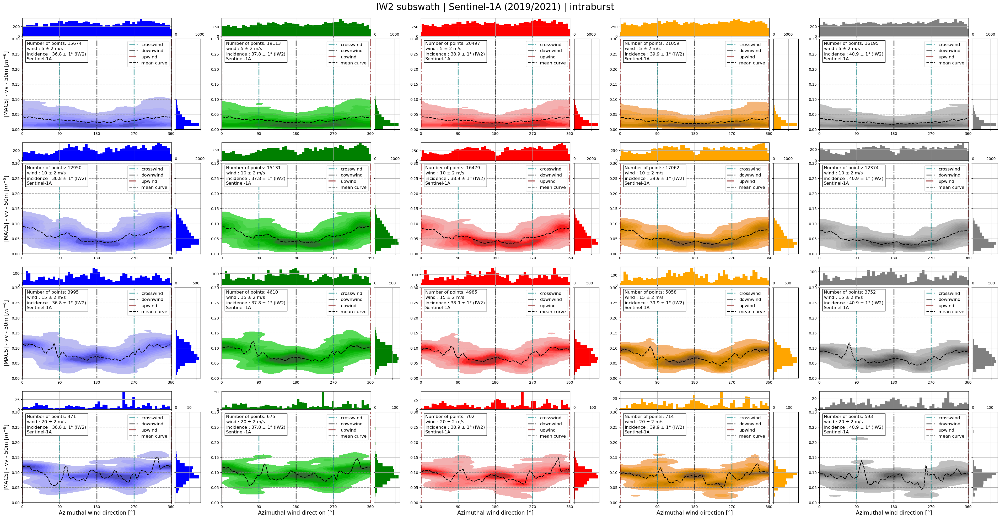

In [15]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange','gray']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw2)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        modmacs_sel = mod_macs_tot[pp][(inc_tot[pp] > mean_iangle_iw2[cpt]-1) & (inc_tot[pp] < mean_iangle_iw2[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        modmacs_sel = modmacs_sel[modmacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[modmacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        modmacs_before = modmacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        modmacs_after = modmacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        modmacs_ext = pd.concat([modmacs_before, modmacs_sel, modmacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=modmacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw2)%2 == 0 and cpt == (len(mean_iangle_iw2)/2)-1: 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw2)%2 == 1 and cpt == len(mean_iangle_iw2)/2 - 0.5 : 
                ax.set_title('IW2 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('|MACS| - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2) \nSentinel-1A' %(len(modmacs_sel), (pp+1)*5, mean_iangle_iw2[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, modmacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(modmacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ModMACS_azwdir_IW2_s1a_intra.png',bbox_inches='tight')

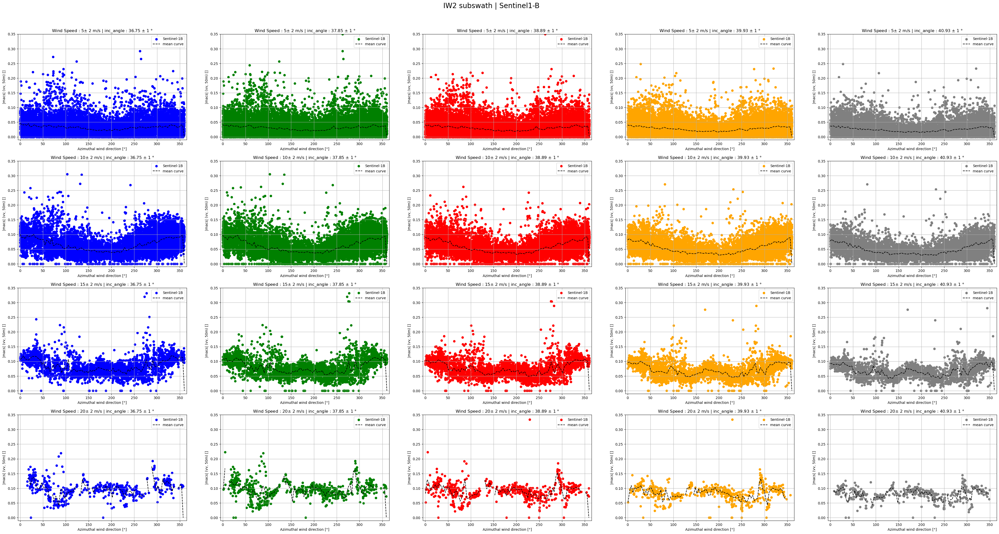

In [38]:
fig, ax = plt.subplots(4,5, figsize=(50,25))
col=['blue', 'green', 'red', 'orange', 'gray']

for i in range(len(inc_tot)) :
    for j in range(len(mean_iangle_iw2)):
        macs_sel = macs[i][(inc_tot[i] > mean_iangle_iw2[j]-1) & (inc_tot[i] < mean_iangle_iw2[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wdir_sel = az_wdir.loc[macs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
        ax[i][j].scatter(az_wdir_sel ,macs_sel, color = col[j], label='Sentinel-1B')

        # mean curve calculation
        az_wdir_sel_mean = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100) # settings points for the mean curve
        mod_macs_mean = np.zeros_like(az_wdir_sel_mean)                         # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wdir_sel >= bin_edges[k]) & (az_wdir_sel < bin_edges[k+1])        # Mask to selects the points in the bin
            mod_macs_mean[k] = np.mean(macs_sel[mask]) if np.sum(mask) > 0 else np.nan   # Calculation of the Imacs mean value in the bin
        ax[i][j].plot(az_wdir_sel_mean, mod_macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        
        ax[i][j].grid()
        ax[i][j].legend()
        ax[i][j].set_xlim(-5,365)
        ax[i][j].set_ylim(-0.01,0.35)
        ax[i][j].set_xlabel('Azimuthal wind direction [°]')
        ax[i][j].set_ylabel('|macs| (vv, 50m) []')
        ax[i][j].set_title(r'Wind Speed : '+str((i+1)*5)+'$\pm$ 2 m/s | inc_angle : '+ str("{:.2f}".format(float(mean_iangle_iw2[j])))+' $\pm$ 1 °')   

fig.suptitle('IW2 subswath | Sentinel1-B',y=0.93, fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B/mod_MACS_allS1B_iw2.png')
fig.show()

## 6.3) Plot of all iw3 subswaths for all Sentinel1-B data

Ploting time : 219.2044129371643 s


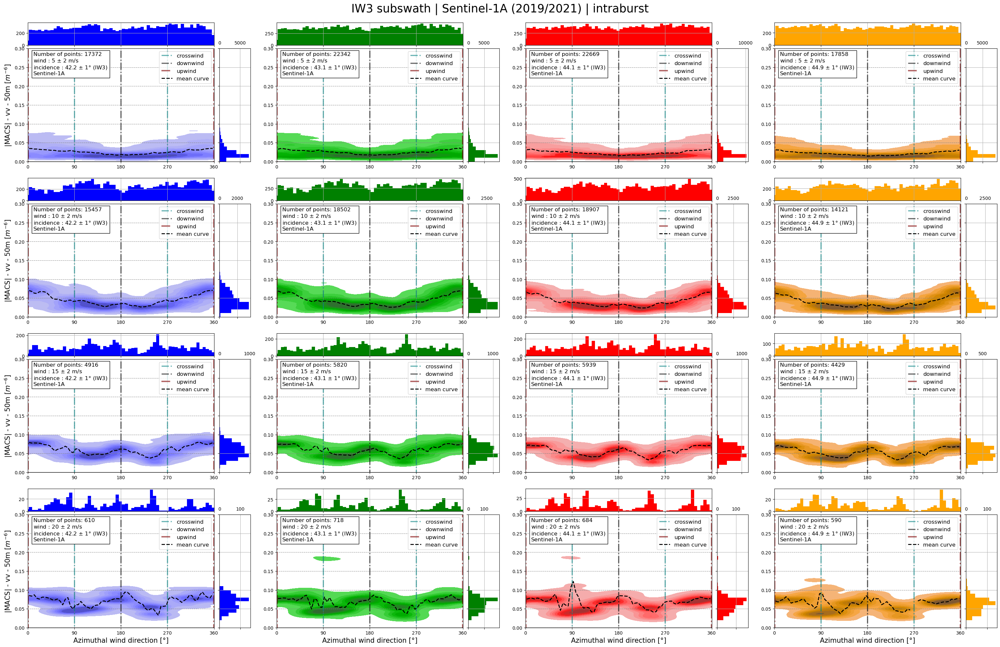

In [16]:
start_time = time.time()

fig=plt.figure(figsize=(8,5))
dx = 0.1; dy = 0.1
wdt = 0.85  ; hgt = 0.85

col=['blue', 'green', 'red', 'orange']

for pp in range(len(inc_tot)) :              # discretization over the wind spd
    for cpt in range(len(mean_iangle_iw3)):  # discretization over the incindence angles


        ### Selection of the data ###
        
        modmacs_sel = mod_macs_tot[pp][(inc_tot[pp] > mean_iangle_iw3[cpt]-1) & (inc_tot[pp] < mean_iangle_iw3[cpt]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        modmacs_sel = modmacs_sel[modmacs_sel !=0]            # selection of non nul values
        az_wdir_sel = az_wdir.loc[modmacs_sel.index]      # selection of the az_wdir corresponding to the range 

        
        ## Dataframe boundaries extension
        
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        modmacs_before = modmacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        modmacs_after = modmacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        modmacs_ext = pd.concat([modmacs_before, modmacs_sel, modmacs_after])
        az_wdir_ext = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        
        ymin=0;ymax=0.3;ybinwidth=ymax/30
        xmin=0;xmax=360;xbinwidth=1

        gs = fig.add_gridspec(2, 2,  width_ratios = (6, 1), height_ratios = (1, 5),
                      left   = dx + (wdt + dx)*cpt, right = dx + wdt + (dx + wdt)*cpt,
                      bottom = dy + (hgt + dy)*(-pp), top   = dy + hgt + (dy + hgt)*(-pp),
                      wspace = 0.05, hspace = 0.05)                              

        ax = fig.add_subplot(gs[1, 0])
        ax_histx = fig.add_subplot(gs[0, 0], sharex = ax)
        ax_histy = fig.add_subplot(gs[1, 1], sharey = ax)
        ax_histx.tick_params(axis="x", labelbottom=False)
        ax_histy.tick_params(axis="y", labelleft=False)
        ax_histy.xaxis.set_tick_params(labeltop=True)
        ax_histy.xaxis.set_tick_params(labelbottom=False)

        ### Central plot
        sns.kdeplot(x=az_wdir_ext, y=modmacs_ext, color=col[cpt], fill=True, bw_adjust=.5, ax=ax)
        
        ax.hlines(0,-70,420, color='black', lw=1) 
        ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax.hlines(0,-70,420, color='black', lw=1) 

        ax.set_xticks([0,90,180,270,360])
        ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
        
        if pp == len(inc_tot)-1:
            ax.set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax.set_xlabel('', fontsize=15)
        if pp == 0 : 
            if len(mean_iangle_iw3)%2 == 0 and cpt == (len(mean_iangle_iw3)/2)-1: 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=1+2*dx ,fontsize=25)
            elif len(mean_iangle_iw3)%2 == 1 and cpt == len(mean_iangle_iw3)/2 - 0.5 : 
                ax.set_title('IW3 subswath | Sentinel-1A (2019/2021) | intraburst',y=1.3, x=0.5 ,fontsize=25)
        if cpt == 0:
            ax.set_ylabel('|MACS| - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax.set_ylabel('', fontsize=15)
       
        ax.grid(linestyle = '--', color = 'gray', alpha = 0.9)

        txt_str = 'Number of points: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3) \nSentinel-1A' %(len(modmacs_sel), (pp+1)*5, mean_iangle_iw3[cpt])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
        
        
        ### mean curve calculation
        mean_curve_calcandplot(az_wdir_ext, modmacs_ext)

        
        ### density plots        
        x_bins = np.arange(-70,420 + xbinwidth, xbinwidth*6)
        ax_histx.hist(az_wdir_sel,bins=x_bins, color=col[cpt])
        ax_histx.grid()
        
        y_bins = np.arange(ymin, ymax , ybinwidth)
        ax_histy.hist(modmacs_sel, bins=y_bins, color=col[cpt], orientation='horizontal')
        ax_histy.grid()
        
        
        ax.legend(fontsize=12)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_4.1/intra/S1A/ModMACS_azwdir_IW3_s1a_intra.png',bbox_inches='tight')

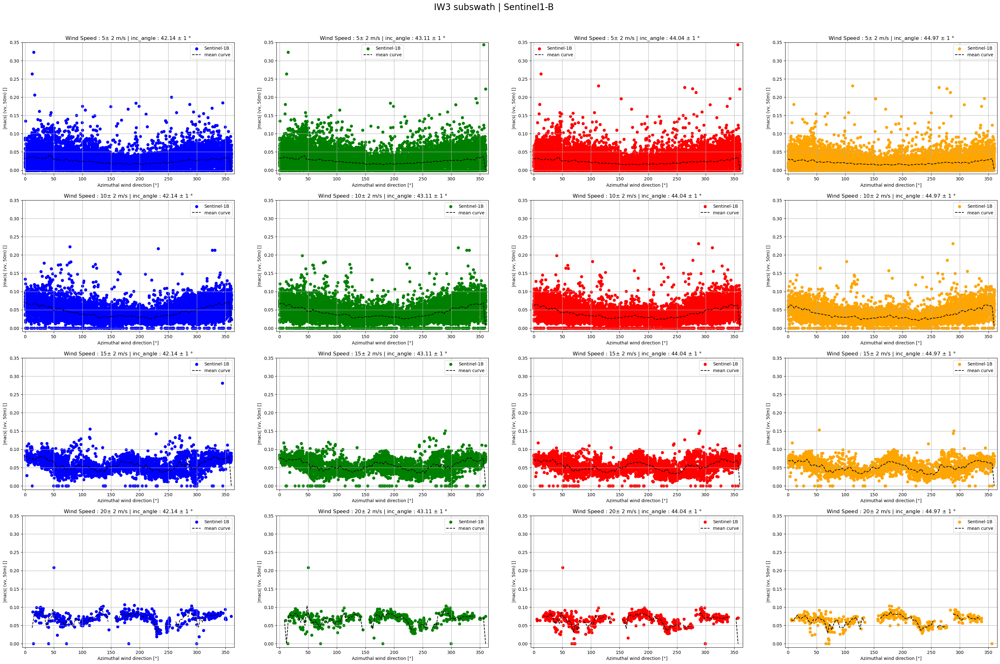

In [40]:
fig, ax = plt.subplots(4,4, figsize=(40,25))
col=['blue', 'green', 'red', 'orange']

for i in range(len(inc_tot)) :
    for j in range(len(mean_iangle_iw3)):
        macs_sel = macs[i][(inc_tot[i] > mean_iangle_iw3[j]-1) & (inc_tot[i] < mean_iangle_iw3[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wdir_sel = az_wdir.loc[macs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
        ax[i][j].scatter(az_wdir_sel ,macs_sel, color = col[j], label='Sentinel-1B')

        # mean curve calculation
        az_wdir_sel_mean = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100) # settings points for the mean curve
        mod_macs_mean = np.zeros_like(az_wdir_sel_mean)                         # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wdir_sel), max(az_wdir_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wdir_sel >= bin_edges[k]) & (az_wdir_sel < bin_edges[k+1])        # Mask to selects the points in the bin
            mod_macs_mean[k] = np.mean(macs_sel[mask]) if np.sum(mask) > 0 else np.nan   # Calculation of the Imacs mean value in the bin
        ax[i][j].plot(az_wdir_sel_mean, mod_macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        
        ax[i][j].grid()
        ax[i][j].legend()
        ax[i][j].set_xlim(-5,365)
        ax[i][j].set_ylim(-0.01,0.35)
        ax[i][j].set_xlabel('Azimuthal wind direction [°]')
        ax[i][j].set_ylabel('|macs| (vv, 50m) []')
        ax[i][j].set_title(r'Wind Speed : '+str((i+1)*5)+'$\pm$ 2 m/s | inc_angle : '+ str("{:.2f}".format(float(mean_iangle_iw3[j])))+' $\pm$ 1 °')   

fig.suptitle('IW3 subswath | Sentinel1-B',y=0.93, fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B/mod_MACS_allS1B_iw3.png')
fig.show()

# 7) macs versus radial wind speed

In [41]:
az_wspd = wnd_spd*np.cos(az_wdir*(np.pi/180))

## 7.0) For all incidence angles (first look) 

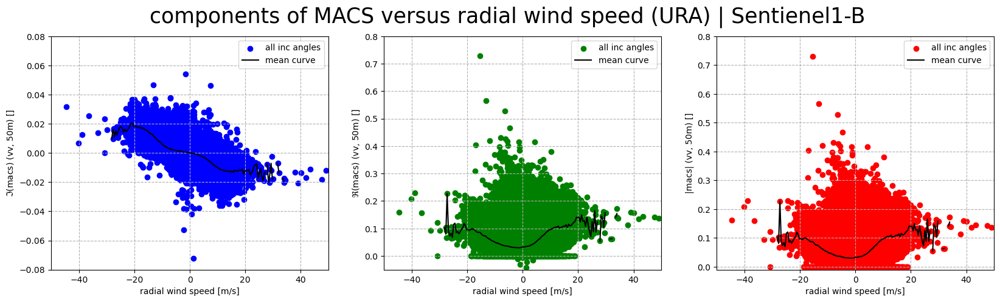

In [44]:
fig, ax = plt.subplots(1,3, figsize=(20,5))

### Imacs ###
ax[0].scatter(az_wspd, macs_Im, color = 'blue', label='all inc angles')

# mean curve calculation
az_wspd_mean = np.linspace(min(az_wspd), max(az_wspd), 200) # settings points for the mean curve
Imacs_mean = np.zeros_like(az_wspd_mean)                    # Initialise mean Imacs values
bin_edges = np.linspace(min(az_wspd), max(az_wspd), 200)    # discretize the data in 100 bins 
for i in range(len(bin_edges) - 1):
    mask = (az_wspd >= bin_edges[i]) & (az_wspd < bin_edges[i+1])        # Mask to selects the points in the bin
    Imacs_mean[i] = np.mean(macs_Im[mask])                               # Calculation of the Imacs mean value in the bin
ax[0].plot(az_wspd_mean, Imacs_mean, color='black', label='mean curve')    # plot the mean curve

ax[0].grid(linestyle='--')
ax[0].legend()
ax[0].set_xlim(-50,50)
ax[0].set_ylim(-0.08,0.08)
ax[0].set_xlabel('radial wind speed [m/s]')
ax[0].set_ylabel('$\Im$(macs) (vv, 50m) []')


### Re(macs) ###
ax[1].scatter(az_wspd, macs_Re, color = 'green', label='all inc angles')

# mean curve calculation
az_wspd_mean = np.linspace(min(az_wspd), max(az_wspd), 200) # settings points for the mean curve
Remacs_mean = np.zeros_like(az_wspd_mean)                   # Initialise mean Imacs values
bin_edges = np.linspace(min(az_wspd), max(az_wspd), 200)    # discretize the data in 100 bins 
for i in range(len(bin_edges) - 1):
    mask = (az_wspd >= bin_edges[i]) & (az_wspd < bin_edges[i+1])         # Mask to selects the points in the bin
    Remacs_mean[i] = np.mean(macs_Re[mask])                               # Calculation of the Imacs mean value in the bin
ax[1].plot(az_wspd_mean, Remacs_mean, color='black', label='mean curve')  # plot the mean curve

ax[1].grid(linestyle='--')
ax[1].legend()
ax[1].set_xlim(-50,50)
ax[1].set_ylim(-0.05,0.8)
ax[1].set_xlabel('radial wind speed [m/s]')
ax[1].set_ylabel('$\Re$(macs) (vv, 50m) []')



### |macs| ###
ax[2].scatter(az_wspd, mod_macs, color = 'red', label='all inc angles')

# mean curve calculation
az_wspd_mean = np.linspace(min(az_wspd), max(az_wspd), 200) # settings points for the mean curve
macs_mean = np.zeros_like(az_wspd_mean)                     # Initialise mean Imacs values
bin_edges = np.linspace(min(az_wspd), max(az_wspd), 200)    # discretize the data in 100 bins 
for i in range(len(bin_edges) - 1):
    mask = (az_wspd >= bin_edges[i]) & (az_wspd < bin_edges[i+1])         # Mask to selects the points in the bin
    macs_mean[i] = np.mean(mod_macs[mask])                                # Calculation of the Imacs mean value in the bin
ax[2].plot(az_wspd_mean, macs_mean, color='black', label='mean curve')  # plot the mean curve

ax[2].grid(linestyle='--')
ax[2].legend()
ax[2].set_xlim(-50,50)
ax[2].set_ylim(-0.01,0.8)
ax[2].set_xlabel('radial wind speed [m/s]')
ax[2].set_ylabel('|macs| (vv, 50m) []')

fig.suptitle('components of MACS versus radial wind speed (URA) | Sentienel1-B', fontsize=25)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B//MACSvsURA_allS1B_all_iangle.png')
fig.show()

In [43]:
MACS = [macs_Re, mod_macs]
macs_str =['$\Re$(macs)', '|macs|']

## 7.1) IW1

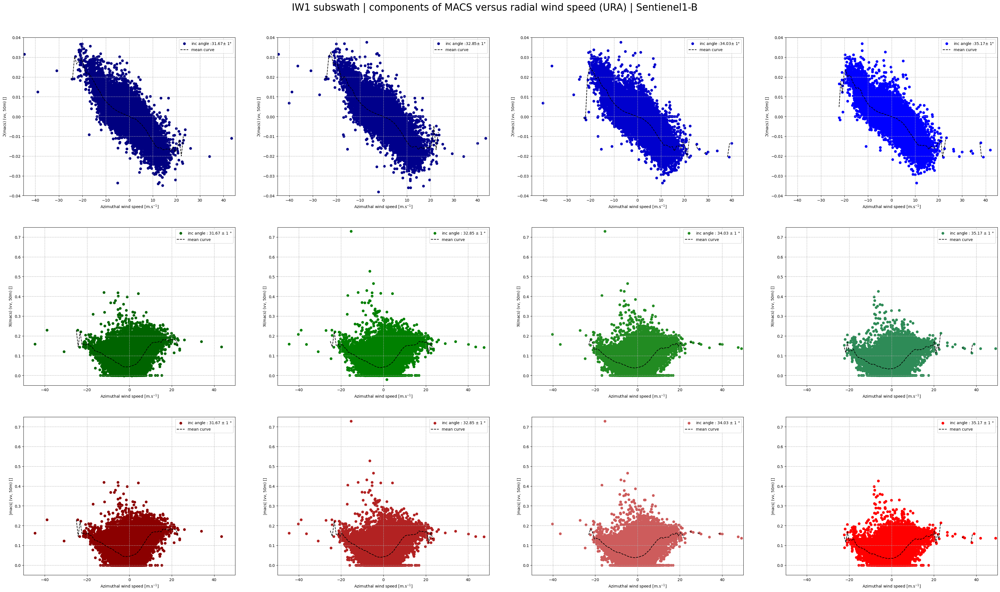

In [45]:
fig, ax = plt.subplots(3,4, figsize=(45,25))

colIW1 = [['navy','darkblue', 'mediumblue', 'blue'],
          ['darkgreen','green','forestgreen','seagreen'],
          ['darkred','firebrick','indianred','red']]


### For Imacs ###
for j in range(len(mean_iangle_iw1)):
    macs_sel = macs_Im[(incidence > mean_iangle_iw1[j]-1) & (incidence < mean_iangle_iw1[j]+1)]  # selection of a range of 1° around one mean incidence angle
    az_wspd_sel = az_wspd.loc[macs_sel.index]                                                    # selection of the az_wdir corresponding to the range 
    ax[0][j].scatter(az_wspd_sel ,macs_sel, color = colIW1[0][j], label='inc angle :'+ str("{:.2f}".format(float(mean_iangle_iw1[j])))+ '$\pm$ 1°')

    # mean curve calculation
    az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
    macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
    bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
    for k in range(len(bin_edges) - 1):
        mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
        macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
    ax[0][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

    ax[0][j].grid(linestyle='--')
    ax[0][j].legend()
    ax[0][j].set_ylim(-0.04,0.04)
    ax[0][j].set_xlim(-45,45)
    ax[0][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
    ax[0][j].set_ylabel('$\Im$(macs) (vv, 50m) []') 


### For Remacs & |macs| ###
for i in range(len(MACS)) :
    for j in range(len(mean_iangle_iw1)):
        macs_sel = MACS[i][(incidence > mean_iangle_iw1[j]-1) & (incidence < mean_iangle_iw1[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wspd_sel = az_wspd.loc[macs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
        ax[i+1][j].scatter(az_wspd_sel ,macs_sel, color = colIW1[i+1][j], label='inc angle : '+ str("{:.2f}".format(float(mean_iangle_iw1[j])))+' $\pm$ 1 °')

        # mean curve calculation
        az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
        macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
            macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
        ax[i+1][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        ax[i+1][j].grid(linestyle='--')
        ax[i+1][j].legend()
        ax[i+1][j].set_xlim(-50,50)
        ax[i+1][j].set_ylim(-0.05,0.75)
        ax[i+1][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
        ax[i+1][j].set_ylabel(macs_str[i]+' (vv, 50m) []')

fig.suptitle('IW1 subswath | components of MACS versus radial wind speed (URA) | Sentienel1-B',y=0.93, fontsize=25)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B//MACSvsURA_allS1B_iw1.png')
fig.show()

## 7.2) IW2

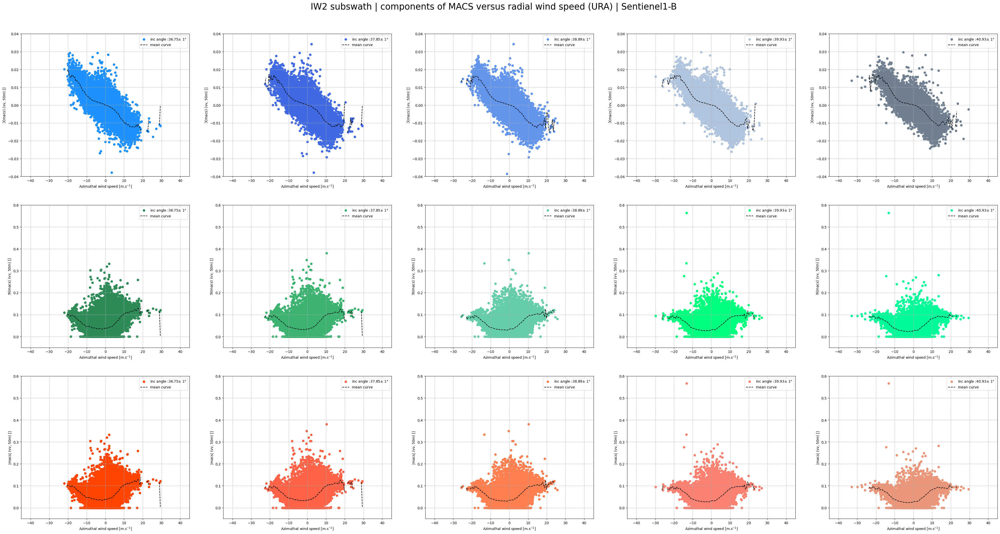

In [46]:
fig, ax = plt.subplots(3,5, figsize=(50,25))

colIW2 = [['dodgerblue','royalblue', 'cornflowerblue', 'lightsteelblue', 'slategrey'],
          ['seagreen','mediumseagreen','mediumaquamarine','springgreen','mediumspringgreen'],
          ['orangered','tomato','coral','salmon','darksalmon']]

### For Imacs ###
for j in range(len(mean_iangle_iw2)):
    macs_sel = macs_Im[(incidence > mean_iangle_iw2[j]-1) & (incidence < mean_iangle_iw2[j]+1)]  # selection of a range of 1° around one mean incidence angle
    az_wspd_sel = az_wspd.loc[macs_sel.index]                                                    # selection of the az_wdir corresponding to the range 
    ax[0][j].scatter(az_wspd_sel ,macs_sel, color = colIW2[0][j], label='inc angle :'+ str("{:.2f}".format(float(mean_iangle_iw2[j])))+ '$\pm$ 1°')

    # mean curve calculation
    az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
    macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
    bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
    for k in range(len(bin_edges) - 1):
        mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
        macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
    ax[0][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

    ax[0][j].grid(linestyle='--')
    ax[0][j].legend()
    ax[0][j].set_ylim(-0.04,0.04)
    ax[0][j].set_xlim(-45,45)
    ax[0][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
    ax[0][j].set_ylabel('$\Im$(macs) (vv, 50m) []') 


### For Remacs & |macs| ###
for i in range(len(MACS)) :
    for j in range(len(mean_iangle_iw2)):
        macs_sel = MACS[i][(incidence > mean_iangle_iw2[j]-1) & (incidence < mean_iangle_iw2[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wspd_sel = az_wspd.loc[macs_sel.index]                                                    # selection of the az_wdir corresponding to the range 
        ax[i+1][j].scatter(az_wspd_sel ,macs_sel, color = colIW2[i+1][j], label='inc angle :'+ str("{:.2f}".format(float(mean_iangle_iw2[j])))+ '$\pm$ 1°')

        # mean curve calculation
        az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
        macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
            macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
        ax[i+1][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        ax[i+1][j].grid(linestyle='--')
        ax[i+1][j].legend()
        ax[i+1][j].set_xlim(-45,45)
        ax[i+1][j].set_ylim(-0.05,0.6)
        ax[i+1][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
        ax[i+1][j].set_ylabel(macs_str[i]+' (vv, 50m) []') 

fig.suptitle('IW2 subswath | components of MACS versus radial wind speed (URA) | Sentienel1-B',y=0.93, fontsize=25)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B//MACSvsURA_allS1B_iw2.png')
fig.show()

## 7.3) IW3 

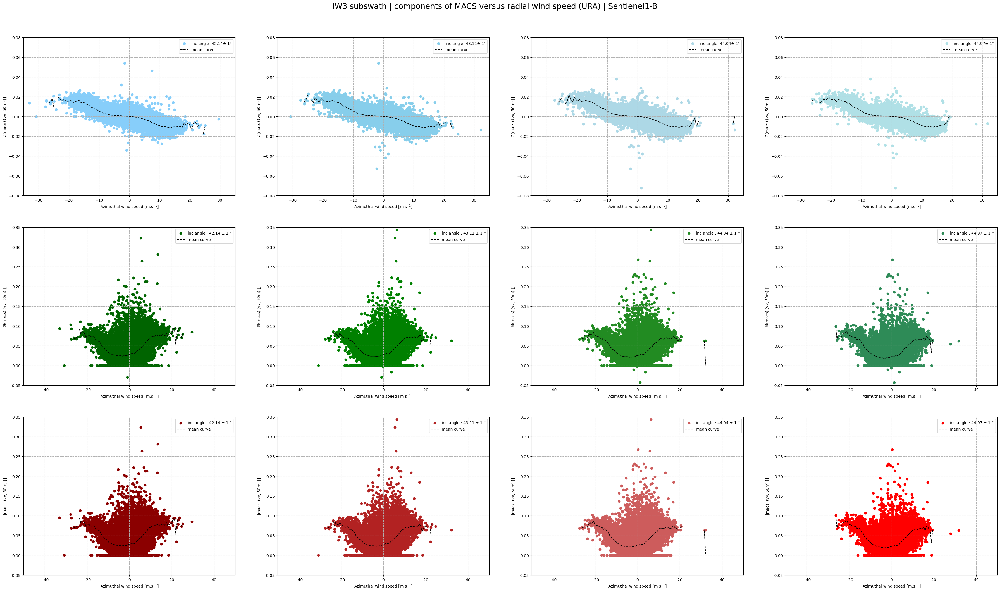

In [47]:
fig, ax = plt.subplots(3,4, figsize=(45,25))

colIW3 = [['lightskyblue','skyblue', 'lightblue', 'powderblue'],
          ['palereen','greenyellow','chartreuse','lawngreen'],
          ['sandybrown','bisque','peachpuff','linen']]


### For Imacs ###
for j in range(len(mean_iangle_iw3)):
    macs_sel = macs_Im[(incidence > mean_iangle_iw3[j]-1) & (incidence < mean_iangle_iw3[j]+1)]  # selection of a range of 1° around one mean incidence angle
    az_wspd_sel = az_wspd.loc[macs_sel.index]                                                    # selection of the az_wdir corresponding to the range 
    ax[0][j].scatter(az_wspd_sel ,macs_sel, color = colIW3[0][j], label='inc angle :'+ str("{:.2f}".format(float(mean_iangle_iw3[j])))+ '$\pm$ 1°')

    # mean curve calculation
    az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
    macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
    bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
    for k in range(len(bin_edges) - 1):
        mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
        macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
    ax[0][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

    ax[0][j].grid(linestyle='--')
    ax[0][j].legend()
    ax[0][j].set_ylim(-0.08,0.08)
    ax[0][j].set_xlim(-35,35)
    ax[0][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
    ax[0][j].set_ylabel('$\Im$(macs) (vv, 50m) []') 


### For Remacs & |macs| ###
for i in range(len(MACS)) :
    for j in range(len(mean_iangle_iw3)):
        macs_sel = MACS[i][(incidence > mean_iangle_iw3[j]-1) & (incidence < mean_iangle_iw3[j]+1)]  # selection of a range of 1° around one mean incidence angle
        az_wspd_sel = az_wspd.loc[macs_sel.index]                                                     # selection of the az_wdir corresponding to the range 
        ax[i+1][j].scatter(az_wspd_sel ,macs_sel, color = colIW1[i+1][j], label='inc angle : '+ str("{:.2f}".format(float(mean_iangle_iw3[j])))+' $\pm$ 1 °')

        # mean curve calculation
        az_wspd_sel_mean = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100) # settings points for the mean curve
        macs_mean = np.zeros_like(az_wspd_sel_mean)                             # Initialise mean s0 values
        bin_edges = np.linspace(min(az_wspd_sel), max(az_wspd_sel), 100)        # discretize the data in 100 bins 
        for k in range(len(bin_edges) - 1):
            mask = (az_wspd_sel >= bin_edges[k]) & (az_wspd_sel < bin_edges[k+1])  # Mask to selects the points in the bin
            macs_mean[k] = np.mean(macs_sel[mask])                                 # Calculation of the Imacs mean value in the bin
        ax[i+1][j].plot(az_wspd_sel_mean, macs_mean, color='black', label='mean curve', linestyle='--' )     # plot the mean curve

        ax[i+1][j].grid(linestyle='--')
        ax[i+1][j].legend()
        ax[i+1][j].set_xlim(-50,50)
        ax[i+1][j].set_ylim(-0.05,0.35)
        ax[i+1][j].set_xlabel('Azimuthal wind speed [m.s$^{-1}$]')
        ax[i+1][j].set_ylabel(macs_str[i]+' (vv, 50m) []')

fig.suptitle('IW3 subswath | components of MACS versus radial wind speed (URA) | Sentienel1-B',y=0.93, fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/all_S1B//MACSvsURA_allS1B_iw3.png')
fig.show()